## Initializing

In [1]:
import pandas as pd
import plotly.express as px

In [3]:
pd.set_option('display.max_columns', None)

In [5]:
Hotel_A_Train = pd.read_csv(r"C:\Users\8027115\Data Xplore\Stage 3\Reference Files\Docs Provided\Hotel-A-train.csv")

In [6]:
Hotel_A_Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27499 entries, 0 to 27498
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Reservation-id          27499 non-null  int64  
 1   Gender                  27499 non-null  object 
 2   Age                     27499 non-null  int64  
 3   Ethnicity               27499 non-null  object 
 4   Educational_Level       27499 non-null  object 
 5   Income                  27499 non-null  object 
 6   Country_region          27499 non-null  object 
 7   Hotel_Type              27499 non-null  object 
 8   Expected_checkin        27499 non-null  object 
 9   Expected_checkout       27499 non-null  object 
 10  Booking_date            27499 non-null  object 
 11  Adults                  27499 non-null  int64  
 12  Children                27499 non-null  int64  
 13  Babies                  22744 non-null  float64
 14  Meal_Type               27499 non-null

In [9]:
Hotel_A_Train.head(2)

,Reservation-id,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate
0,39428300,M,40,Latino,High-School,<25K,North,City Hotel,2015-07-01,2015-07-02,2015-05-21,4,2,NaN,BB,No,No,No Deposit,Online,Yes,check-out,Yes,0,106.440241
1,77491756,F,49,African American,High-School,50K -- 100K,East,Airport Hotels,2015-07-01,2015-07-02,2015-05-26,1,3,0.0,BB,No,No,Non-Refundable,Online,Yes,check-out,No,0,158.039564


## 1. Data Exploration & Preprocessing

In [12]:
Hotel_A_Train.rename(columns={
    'Reservation-id': 'Reservation_ID'}, inplace=True)

In [14]:
Hotel_A_Train.columns

Index(['Reservation_ID', 'Gender', 'Age', 'Ethnicity', 'Educational_Level',
       'Income', 'Country_region', 'Hotel_Type', 'Expected_checkin',
       'Expected_checkout', 'Booking_date', 'Adults', 'Children', 'Babies',
       'Meal_Type', 'Visted_Previously', 'Previous_Cancellations',
       'Deposit_type', 'Booking_channel', 'Required_Car_Parking',
       'Reservation_Status', 'Use_Promotion', 'Discount_Rate', 'Room_Rate'],
      dtype='object')

### Duplicates

In [17]:
Hotel_A_Train[Hotel_A_Train.duplicated()]

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate


In [19]:
Hotel_A_Train['Reservation_ID'].nunique()

27495

In [21]:
duplicates = Hotel_A_Train['Reservation_ID'].value_counts()[Hotel_A_Train['Reservation_ID'].value_counts() > 1].index
Hotel_A_Train[Hotel_A_Train['Reservation_ID'].isin(duplicates)].sort_values(by='Reservation_ID')

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate
6748,55371044,F,21,African American,College,<25K,South,Resort,2015-10-12,2015-10-16,2015-01-23,4,3,NaN,BB,No,No,Non-Refundable,Online,Yes,check-out,Yes,0,127.000000
6779,55371044,M,20,Latino,College,50K -- 100K,West,City Hotel,2016-06-30,2016-07-02,2016-01-20,2,2,0.0,HB,No,No,No Deposit,Direct,Yes,check-out,Yes,20,170.409138
17661,76641511,F,66,African American,College,<25K,West,Airport Hotels,2015-10-19,2015-10-22,2015-08-24,2,2,0.0,BB,No,No,Non-Refundable,Direct,Yes,no-show,No,10,147.891919
20197,76641511,M,27,Latino,Mid-School,<25K,South,City Hotel,2016-01-20,2016-01-21,2015-11-16,4,1,0.0,HB,No,No,No Deposit,Online,Yes,no-show,No,0,154.037643
15701,91130744,F,49,Asian American,Mid-School,50K -- 100K,North,Resort,2015-07-31,2015-08-01,2015-06-19,4,2,0.0,FB,Yes,No,Non-Refundable,Online,No,no-show,No,20,197.000000
17160,91130744,F,19,African American,Grad,50K -- 100K,South,Airport Hotels,2015-09-28,2015-09-29,2015-04-14,1,3,NaN,HB,Yes,No,Refundable,Agent,Yes,check-out,Yes,10,148.647841
2719,95504255,F,68,Asian American,Mid-School,50K -- 100K,North,Resort,2015-10-29,2015-10-30,2015-10-30,3,1,0.0,BB,No,No,Non-Refundable,Direct,Yes,check-out,Yes,30,231.000000
7456,95504255,F,36,African American,College,<25K,North,Airport Hotels,2016-05-12,2016-05-14,2015-12-11,2,1,0.0,BB,No,No,Refundable,Direct,Yes,check-out,Yes,0,121.322216


* Four Reservation IDs have been duplicated. 
* Atleast one feature differs across duplicates
* But It has to be the primary key

### Null Values

In [25]:
Hotel_A_Train.isnull().sum()

Reservation_ID               0
Gender                       0
Age                          0
Ethnicity                    0
Educational_Level            0
Income                       0
Country_region               0
Hotel_Type                   0
Expected_checkin             0
Expected_checkout            0
Booking_date                 0
Adults                       0
Children                     0
Babies                    4755
Meal_Type                    0
Visted_Previously            0
Previous_Cancellations       0
Deposit_type                 0
Booking_channel              0
Required_Car_Parking         0
Reservation_Status           0
Use_Promotion                0
Discount_Rate                0
Room_Rate                    0
dtype: int64

* Only 'Babies' feature conists of null values 

### Categorical Features Examining (Nominal + Ordinal)

**Gender**

In [30]:
Hotel_A_Train['Gender'].value_counts()

Gender
F    14902
M    12597
Name: count, dtype: int64

**Ethnicity**

In [33]:
Hotel_A_Train['Ethnicity'].value_counts()

Ethnicity
Latino              7909
caucasian           7766
African American    7700
Asian American      4124
Name: count, dtype: int64

**Educational_Level**

In [36]:
Hotel_A_Train['Educational_Level'].value_counts()

Educational_Level
College        11924
Grad            9160
High-School     4613
Mid-School      1802
Name: count, dtype: int64

**Income**

In [39]:
Hotel_A_Train['Income'].value_counts()

Income
50K -- 100K    7936
25K --50K      7870
<25K           7739
>100K          3954
Name: count, dtype: int64

**Country_region**

In [42]:
Hotel_A_Train['Country_region'].value_counts()

Country_region
South    10917
North     5670
East      5460
West      5452
Name: count, dtype: int64

**Hotel_Type**

In [45]:
Hotel_A_Train['Hotel_Type'].value_counts()

Hotel_Type
City Hotel        11731
Airport Hotels     9205
Resort             6563
Name: count, dtype: int64

**Meal_Type**

In [48]:
Hotel_A_Train['Meal_Type'].value_counts()

Meal_Type
BB    14224
HB     8081
FB     5194
Name: count, dtype: int64

**Visted_Previously**

In [51]:
Hotel_A_Train['Visted_Previously'].value_counts()

Visted_Previously
No     18344
Yes     9155
Name: count, dtype: int64

**Previous_Cancellations**

In [54]:
Hotel_A_Train['Previous_Cancellations'].value_counts()

Previous_Cancellations
No     24379
Yes     3120
Name: count, dtype: int64

**Deposit_type**

In [57]:
Hotel_A_Train['Deposit_type'].value_counts()

Deposit_type
No Deposit        14791
Non-Refundable     7941
Refundable         4767
Name: count, dtype: int64

**Booking_channel**

In [60]:
Hotel_A_Train['Booking_channel'].value_counts()

Booking_channel
Online    15574
Direct     7942
Agent      3983
Name: count, dtype: int64

**Required_Car_Parking**

In [63]:
Hotel_A_Train['Required_Car_Parking'].value_counts()

Required_Car_Parking
Yes    19629
No      7870
Name: count, dtype: int64

**Reservation_Status**

In [66]:
Hotel_A_Train['Reservation_Status'].value_counts()

Reservation_Status
check-out    21240
canceled      4134
no-show       2125
Name: count, dtype: int64

**Use_Promotion**

In [69]:
Hotel_A_Train['Use_Promotion'].value_counts()

Use_Promotion
Yes    16230
No     11269
Name: count, dtype: int64

### Discrete Features Examining

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

**Age**

In [74]:
# Hotel_A_Train['Age'].value_counts()

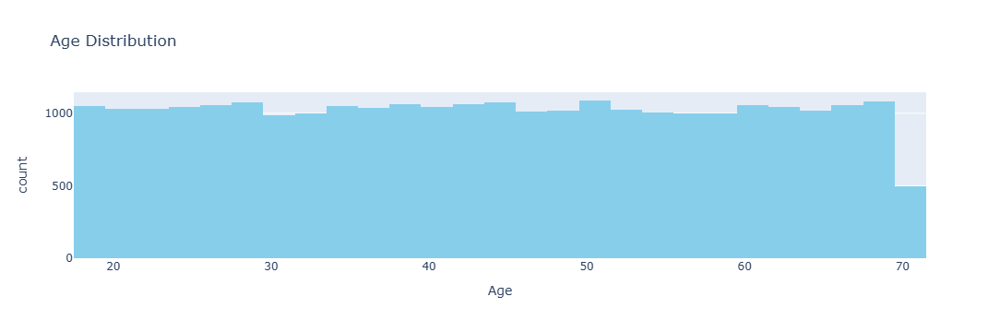

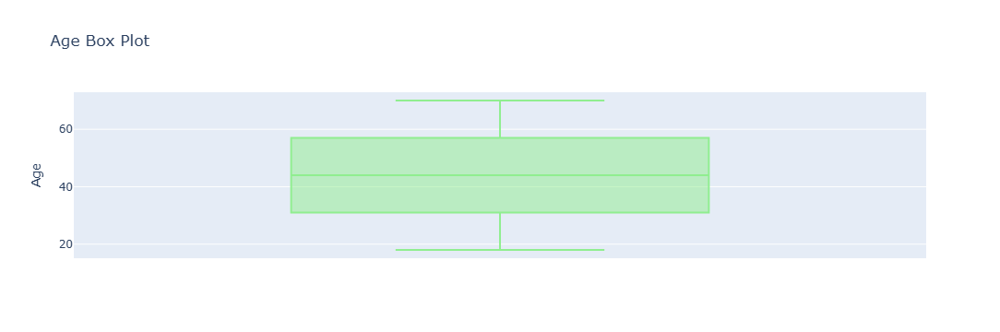

In [75]:
fig_hist = px.histogram(Hotel_A_Train, x='Age', nbins=30, title='Age Distribution', 
                         labels={'Age': 'Age'}, color_discrete_sequence=['skyblue'])
fig_hist.show()
fig_box = px.box(Hotel_A_Train, y='Age', title='Age Box Plot', 
                 labels={'Age': 'Age'}, color_discrete_sequence=['lightgreen'])
fig_box.show()

**Adults**

In [77]:
Hotel_A_Train['Adults'].value_counts()

Adults
2    9788
1    8780
3    4386
4    2858
5    1687
Name: count, dtype: int64

**Children**

In [79]:
Hotel_A_Train['Children'].value_counts()

Children
1    11590
2    11362
3     4547
Name: count, dtype: int64

**Discount_Rate**

In [81]:
Hotel_A_Train['Discount_Rate'].value_counts()

Discount_Rate
0     7728
5     7412
10    5527
15    2598
20    2277
25    1500
30     457
Name: count, dtype: int64

**Babies**

In [88]:
Hotel_A_Train['Babies'].value_counts()

Babies
0.0    15920
1.0     5138
2.0     1686
Name: count, dtype: int64

In [90]:
percentage_null_babies = Hotel_A_Train['Babies'].isnull().mean() * 100
print(f"Percentage of missing values in 'Babies' column: {percentage_null_babies:.2f}%")

Percentage of missing values in 'Babies' column: 17.29%


In [92]:
babies_non_null = Hotel_A_Train[Hotel_A_Train['Babies'].notnull()]
babies_null = Hotel_A_Train[Hotel_A_Train['Babies'].isnull()]

In [94]:
babies_non_null['Babies'] = babies_non_null['Babies'].astype(int)

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\2354828488.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
print("Descriptive Statistics for Non-Null Babies:")
display(babies_non_null.describe())
print("\nDescriptive Statistics for Null Babies:")
display(babies_null.describe())

Descriptive Statistics for Non-Null Babies:


,Reservation_ID,Age,Adults,Children,Babies,Discount_Rate,Room_Rate
count,2.274400e+04,22744.000000,22744.000000,22744.000000,22744.000000,22744.000000,22744.000000
mean,5.013360e+07,43.408196,2.229071,1.741690,0.374165,8.283503,155.526308
std,2.890569e+07,15.226214,1.179314,0.721082,0.618418,7.845258,38.322267
min,3.154000e+03,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000
25%,2.513576e+07,30.000000,1.000000,1.000000,0.000000,0.000000,123.884865
50%,4.998795e+07,43.000000,2.000000,2.000000,0.000000,5.000000,149.234135
75%,7.525257e+07,56.000000,3.000000,2.000000,1.000000,10.000000,180.923904
max,9.999900e+07,70.000000,5.000000,3.000000,2.000000,30.000000,250.000000



Descriptive Statistics for Null Babies:


,Reservation_ID,Age,Adults,Children,Babies,Discount_Rate,Room_Rate
count,4.755000e+03,4755.000000,4755.000000,4755.000000,0.0,4755.000000,4755.000000
mean,5.031298e+07,46.700315,2.246688,1.754364,NaN,8.338591,156.213502
std,2.869607e+07,15.378754,1.184285,0.726200,NaN,7.825463,38.278155
min,2.109900e+04,18.000000,1.000000,1.000000,NaN,0.000000,100.000000
25%,2.567453e+07,34.000000,1.000000,1.000000,NaN,0.000000,124.712668
50%,5.076444e+07,49.000000,2.000000,2.000000,NaN,5.000000,150.317591
75%,7.478957e+07,60.000000,3.000000,2.000000,NaN,15.000000,181.494932
max,9.998883e+07,70.000000,5.000000,3.000000,NaN,30.000000,250.000000


In [98]:
babies_count = babies_non_null['Babies'].value_counts().reset_index()
babies_count.columns = ['Number of Babies', 'Count']
babies_count['Percentage'] = (babies_count['Count'] / babies_count['Count'].sum()) * 100

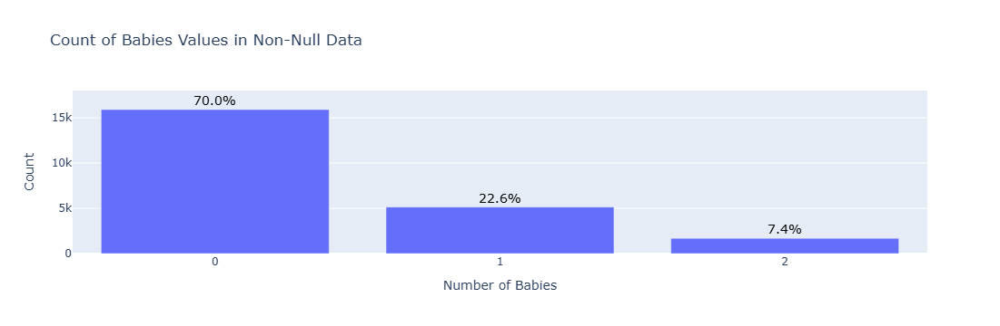

In [100]:
fig = px.bar(
    babies_count,
    x='Number of Babies', 
    y='Count',
    labels={'Number of Babies': 'Number of Babies', 'Count': 'Count'},
    title='Count of Babies Values in Non-Null Data'
)
for i, row in babies_count.iterrows():
    fig.add_annotation(
        x=row['Number of Babies'],
        y=row['Count'],
        text=f"{row['Percentage']:.1f}%",  
        showarrow=False,
        font=dict(size=14, color="black"),
        align="center",
        yshift=10  
    )

fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=babies_count['Number of Babies'],  
        ticktext=babies_count['Number of Babies']
    )
)

fig.show()


In [102]:
categorical_columns = ['Hotel_Type', 'Income', 'Meal_Type',
                       'Reservation_Status', 'Deposit_type',
                      'Gender', 'Visted_Previously',
                      'Previous_Cancellations', 'Required_Car_Parking',
                       'Use_Promotion']

# Display value counts for each categorical column
for column in categorical_columns:
    print(f"\nValue Counts for {column} (Non-Null Babies):")
    print(babies_non_null[column].value_counts())

    print(f"\nValue Counts for {column} (Null Babies):")
    print(babies_null[column].value_counts())



Value Counts for Hotel_Type (Non-Null Babies):
Hotel_Type
City Hotel        9704
Airport Hotels    7628
Resort            5412
Name: count, dtype: int64

Value Counts for Hotel_Type (Null Babies):
Hotel_Type
City Hotel        2027
Airport Hotels    1577
Resort            1151
Name: count, dtype: int64

Value Counts for Income (Non-Null Babies):
Income
50K -- 100K    6534
25K --50K      6510
<25K           6409
>100K          3291
Name: count, dtype: int64

Value Counts for Income (Null Babies):
Income
50K -- 100K    1402
25K --50K      1360
<25K           1330
>100K           663
Name: count, dtype: int64

Value Counts for Meal_Type (Non-Null Babies):
Meal_Type
BB    11777
HB     6654
FB     4313
Name: count, dtype: int64

Value Counts for Meal_Type (Null Babies):
Meal_Type
BB    2447
HB    1427
FB     881
Name: count, dtype: int64

Value Counts for Reservation_Status (Non-Null Babies):
Reservation_Status
check-out    17532
canceled      3450
no-show       1762
Name: count, dtype: int

In [104]:
mode_babies_by_group = babies_non_null.groupby(['Hotel_Type', 'Income', 'Visted_Previously', 'Required_Car_Parking', 'Gender'])['Babies'].agg(lambda x: x.mode()[0]).reset_index()

In [106]:
mode_babies_by_group

,Hotel_Type,Income,Visted_Previously,Required_Car_Parking,Gender,Babies
0,Airport Hotels,25K --50K,No,No,F,0
1,Airport Hotels,25K --50K,No,No,M,0
2,Airport Hotels,25K --50K,No,Yes,F,0
3,Airport Hotels,25K --50K,No,Yes,M,0
4,Airport Hotels,25K --50K,Yes,No,F,0
...,...,...,...,...,...,...
75,Resort,<25K,Yes,Yes,F,0
76,Resort,>100K,No,No,F,0
77,Resort,>100K,No,Yes,F,0
78,Resort,>100K,Yes,No,F,0


In [108]:
mode_babies_by_group['Babies'].value_counts()

Babies
0    80
Name: count, dtype: int64

In [110]:
Hotel_A_Train['Babies'].fillna(0, inplace=True)

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\2965232843.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [112]:
Hotel_A_Train['Babies'] = Hotel_A_Train['Babies'].astype(int)
print(Hotel_A_Train['Babies'].dtype)

int32


### Contns Features Examining

In [115]:
Hotel_A_Train[['Room_Rate']].describe()

,Room_Rate
count,27499.000000
mean,155.645134
std,38.314829
min,100.000000
25%,124.000000
50%,149.453032
75%,181.000000
max,250.000000


In [117]:
import plotly.graph_objects as go
import numpy as np
from scipy.stats import gaussian_kde

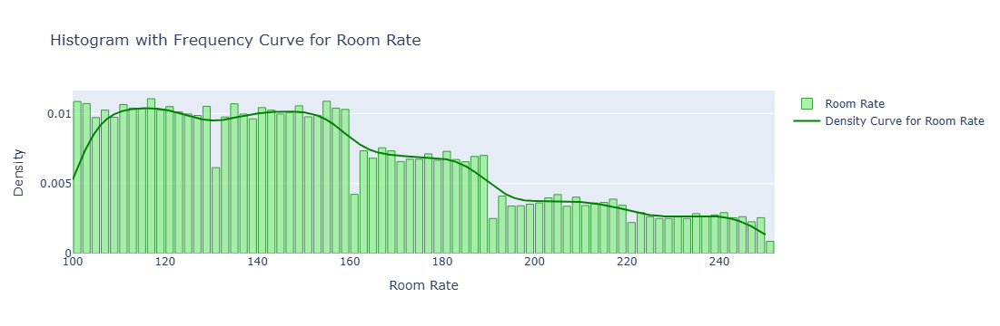

In [119]:
kde = gaussian_kde(Hotel_A_Train['Room_Rate'])
x_vals = np.linspace(Hotel_A_Train['Room_Rate'].min(), Hotel_A_Train['Room_Rate'].max(), 1000)
kde_vals = kde(x_vals)
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=Hotel_A_Train['Room_Rate'],
    histnorm='probability density', 
    name='Room Rate',
    opacity=0.75,
    marker=dict(color='lightgreen', line=dict(color='green', width=1))
))

fig.add_trace(go.Scatter(
    x=x_vals,
    y=kde_vals,
    mode='lines',
    name='Density Curve for Room Rate',
    line=dict(color='green', width=2)
))

fig.update_layout(
    title='Histogram with Frequency Curve for Room Rate',
    xaxis_title='Room Rate',
    yaxis_title='Density',
    #template='plotly_dark',  
    bargap=0.2
)
fig.show()

### Date Features

In [122]:
Hotel_A_Train['Expected_checkin'] = pd.to_datetime(Hotel_A_Train['Expected_checkin'], errors='coerce')
Hotel_A_Train['Expected_checkout'] = pd.to_datetime(Hotel_A_Train['Expected_checkout'], errors='coerce')
Hotel_A_Train['Booking_date'] = pd.to_datetime(Hotel_A_Train['Booking_date'], errors='coerce')

print(Hotel_A_Train[['Expected_checkin', 'Expected_checkout','Booking_date']].dtypes)

Expected_checkin     datetime64[ns]
Expected_checkout    datetime64[ns]
Booking_date         datetime64[ns]
dtype: object


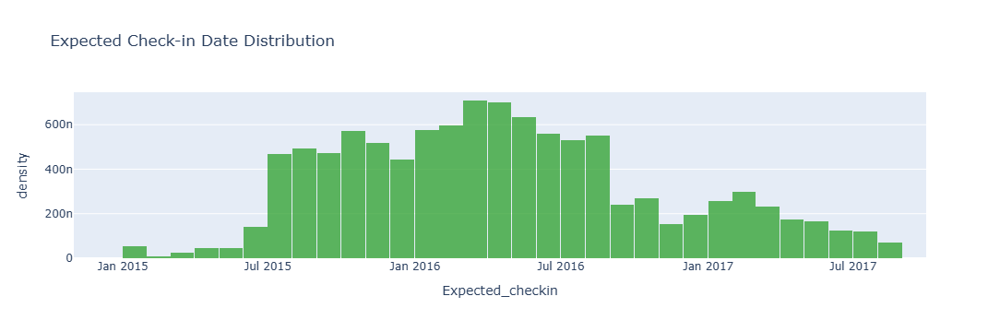

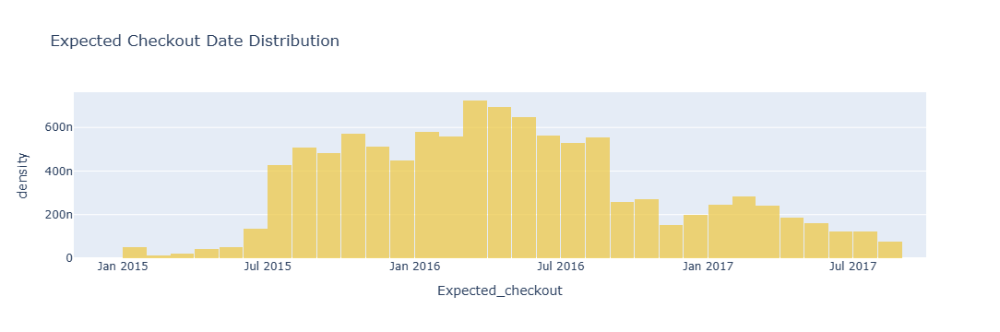

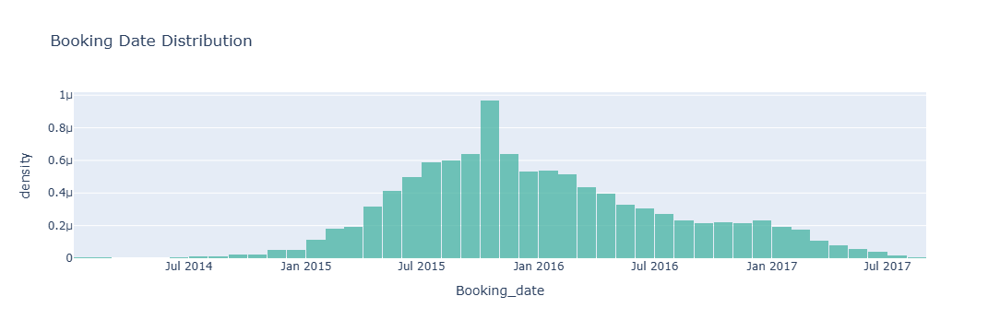

In [124]:
fig_checkin = px.histogram(Hotel_A_Train, x='Expected_checkin', nbins=50, histnorm='density', 
                           title="Expected Check-in Date Distribution")
fig_checkin.update_traces(opacity=0.75, marker=dict(color='#2ca02c'))

fig_checkout = px.histogram(Hotel_A_Train, x='Expected_checkout', nbins=50, histnorm='density', 
                             title="Expected Checkout Date Distribution")
fig_checkout.update_traces(opacity=0.75, marker=dict(color='#edc949'))
fig_Booking = px.histogram(Hotel_A_Train, x='Booking_date', nbins=50, histnorm='density', 
                             title="Booking Date Distribution")
fig_Booking.update_traces(opacity=0.75, marker=dict(color='#46b3a3'))

fig_checkin.show()
fig_checkout.show()
fig_Booking.show()

In [125]:
print("Minimum Expected Check-in Date:", Hotel_A_Train['Expected_checkin'].min())
print("Maximum Expected Check-in Date:", Hotel_A_Train['Expected_checkin'].max())
print("Minimum Expected Checkout Date:", Hotel_A_Train['Expected_checkout'].min())
print("Maximum Expected Checkout Date:", Hotel_A_Train['Expected_checkout'].max())

Minimum Expected Check-in Date: 2014-11-18 00:00:00
Maximum Expected Check-in Date: 2017-09-06 00:00:00
Minimum Expected Checkout Date: 2014-11-22 00:00:00
Maximum Expected Checkout Date: 2017-09-09 00:00:00


In [126]:
Hotel_A_Train[Hotel_A_Train['Expected_checkin'] > Hotel_A_Train['Expected_checkout']]

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate


In [127]:
len(Hotel_A_Train[Hotel_A_Train['Booking_date'] > Hotel_A_Train['Expected_checkin']])

506

In [132]:
506/27499*100

1.8400669115240555

### Duplicates Preprocessing

Creating a new sequential ID column, starting from 1 and ordered by Expected_checkin, is a highly effective approach to address the inconsistencies in the current Reservation_ID column. The existing Reservation_ID appears to suffer from duplication and potential misorder due to manual entry errors, making it unreliable for future analyses. By generating a clean, unique identifier, we can ensure that each row in the dataset has a distinct and sequential ID, resolving these inconsistencies. Sorting by Expected_checkin further enhances this solution, as it orders the data chronologically based on the check-in dates, which is both logical and meaningful in the context of hotel reservations. This chronological order provides a clear, temporal structure to the dataset, facilitating more accurate analyses related to booking trends, resource planning, and time-based operations. Additionally, the new ID allows for smoother data manipulation, tracking, and future merges, making it a robust solution that simplifies the dataset and supports reliable analyses.

In [136]:
Hotel_A_Train_v1 = Hotel_A_Train.sort_values(by='Booking_date')
Hotel_A_Train_v1['New_Reservation_ID'] = range(1, len(Hotel_A_Train_v1) + 1)

## 2. EDA

In [139]:
Hotel_A_Train_v1.head(2)

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate,New_Reservation_ID
2164,83542079,F,60,African American,Grad,<25K,East,Airport Hotels,2015-01-02,2015-01-05,2014-01-09,2,2,0,BB,Yes,No,Refundable,Direct,No,check-out,Yes,5,140.945048,1
2003,82695060,M,49,Latino,College,<25K,East,City Hotel,2015-01-02,2015-01-03,2014-01-14,1,2,2,BB,Yes,No,No Deposit,Online,Yes,check-out,Yes,0,128.429209,2


In [710]:
summary = Hotel_A_Train_v1[['Age', 'Adults', 'Children','Babies','Discount_Rate','Room_Rate']].describe()
summary = summary.drop(['count', 'std'])
summary = summary.round(2)

In [712]:
summary

,Age,Adults,Children,Babies,Discount_Rate,Room_Rate
mean,43.98,2.23,1.74,0.31,8.29,155.65
min,18.00,1.00,1.00,0.00,0.00,100.00
25%,31.00,1.00,1.00,0.00,0.00,124.00
50%,44.00,2.00,2.00,0.00,5.00,149.45
75%,57.00,3.00,2.00,0.00,10.00,181.00
max,70.00,5.00,3.00,2.00,30.00,250.00


## 3. Feature Engineering

In [142]:
def feature_engineering(df):
    df['Expected_checkin'] = pd.to_datetime(df['Expected_checkin'], errors='coerce')
    df['Expected_checkout'] = pd.to_datetime(df['Expected_checkout'], errors='coerce')
    df['Booking_date'] = pd.to_datetime(df['Booking_date'], errors='coerce')

    df['Expected_checkin_year'] = df['Expected_checkin'].dt.year
    df['Expected_checkin_month'] = df['Expected_checkin'].dt.month
    df['Expected_checkin_day'] = df['Expected_checkin'].dt.day
    df['Expected_checkin_day_of_week'] = df['Expected_checkin'].dt.dayofweek

    # Extracting check-out date components
    df['Expected_checkout_year'] = df['Expected_checkout'].dt.year
    df['Expected_checkout_month'] = df['Expected_checkout'].dt.month
    df['Expected_checkout_day'] = df['Expected_checkout'].dt.day
    df['Checkout_day_of_week'] = df['Expected_checkout'].dt.dayofweek

    # Extracting booking date components
    df['Booking_date_year'] = df['Booking_date'].dt.year
    df['Booking_date_month'] = df['Booking_date'].dt.month
    df['Booking_date_day'] = df['Booking_date'].dt.day
    df['Booking_day_of_week'] = df['Booking_date'].dt.dayofweek

    # Calculating durations
    df['Duration_checkin_checkout'] = (df['Expected_checkout'] - df['Expected_checkin']).dt.days
    df['Booking_to_checkin_duration'] = (df['Expected_checkin'] - df['Booking_date']).dt.days

    # Adding the number of people (excluding babies)
    df['No_of_ppl_without_babies'] = df['Adults'] + df['Children']  # + df['Babies'] (optional)

    # Calculating the number of rooms based on the number of people
    df['No_of_Rooms'] = df['No_of_ppl_without_babies'].apply(lambda x: 1 if x <= 5 else 2)

    # Calculating revenue
    df['Revenue'] = df['Room_Rate'] * df['Duration_checkin_checkout'] * df['No_of_Rooms']
    df['Revenue_with_disc'] = df['Revenue'] * (100 - (df['Discount_Rate'])) / 100

    # Log-transformed revenue
    df['Revenue_with_disc_log'] = np.log(df['Revenue_with_disc'] + 1)
    return df


In [144]:
Hotel_A_Train_v1 = feature_engineering(Hotel_A_Train_v1)

**Inavlid Booking Dates**

In [146]:
invalid_booking_dates = Hotel_A_Train_v1[Hotel_A_Train_v1['Booking_to_checkin_duration'] < 0]
print(f"Number of invalid booking dates: {invalid_booking_dates.shape[0]}")
display(invalid_booking_dates[['New_Reservation_ID', 'Booking_date', 'Expected_checkin','Deposit_type', 'Booking_to_checkin_duration','Reservation_Status','Booking_channel','Country_region','Discount_Rate']])

Number of invalid booking dates: 506


,New_Reservation_ID,Booking_date,Expected_checkin,Deposit_type,Booking_to_checkin_duration,Reservation_Status,Booking_channel,Country_region,Discount_Rate
14745,666,2015-01-22,2015-01-21,No Deposit,-1,canceled,Online,South,0
14862,1311,2015-03-05,2015-03-03,No Deposit,-2,canceled,Direct,North,25
14895,1825,2015-04-03,2015-04-02,No Deposit,-1,check-out,Online,East,0
15110,4036,2015-06-10,2015-06-09,No Deposit,-1,canceled,Online,South,15
18,5098,2015-07-03,2015-07-02,Non-Refundable,-1,check-out,Online,East,10
...,...,...,...,...,...,...,...,...,...
14580,27470,2017-07-16,2017-07-15,No Deposit,-1,check-out,Direct,West,5
13072,27474,2017-07-18,2017-07-17,No Deposit,-1,no-show,Direct,South,15
13220,27480,2017-07-26,2017-07-25,Non-Refundable,-1,check-out,Online,South,25
13790,27494,2017-08-13,2017-08-12,No Deposit,-1,check-out,Online,West,0


In [148]:
invalid_booking_dates.groupby('Reservation_Status')['Booking_to_checkin_duration'].value_counts()

Reservation_Status  Booking_to_checkin_duration
canceled            -1                              16
                    -3                               5
                    -2                               4
                    -4                               1
check-out           -1                             247
                    -2                             124
                    -3                              70
                    -4                              22
no-show             -1                              11
                    -2                               4
                    -3                               2
Name: count, dtype: int64

In [150]:
invalid_booking_dates['Reservation_Status'].value_counts()

Reservation_Status
check-out    463
canceled      26
no-show       17
Name: count, dtype: int64

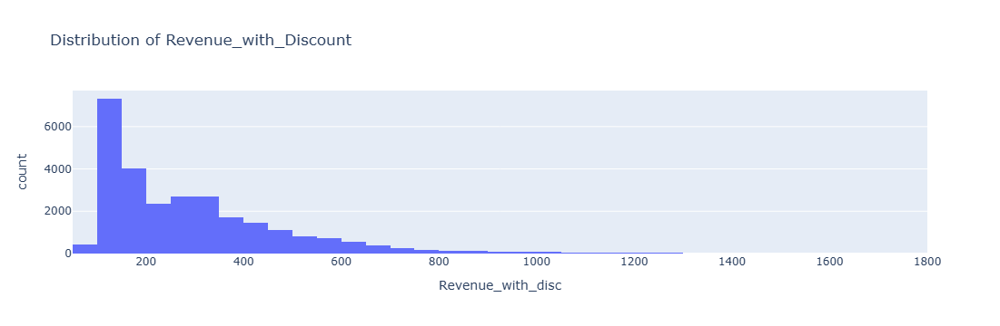

In [688]:
fig = px.histogram(Hotel_A_Train_v1, x='Revenue_with_disc', 
                   title="Distribution of Revenue_with_Discount",
                   #labels={'Booking_to_checkin_duration': 'Booking to Check-in Duration (days)'}, 
                   nbins=50)  
fig.show()

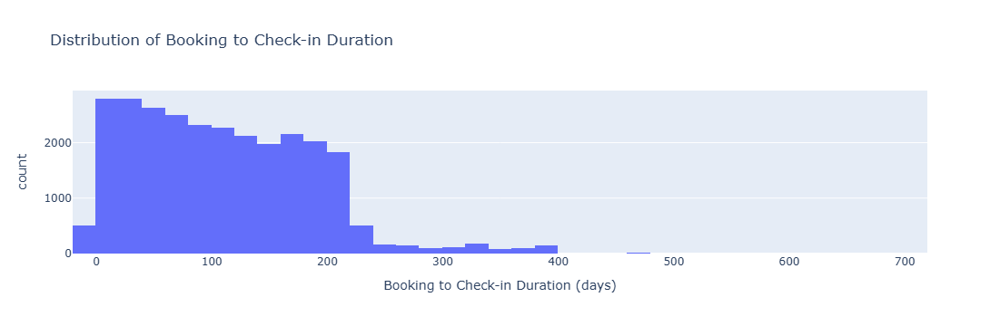

In [152]:
fig = px.histogram(Hotel_A_Train_v1, x='Booking_to_checkin_duration', 
                   title="Distribution of Booking to Check-in Duration",
                   labels={'Booking_to_checkin_duration': 'Booking to Check-in Duration (days)'}, 
                   nbins=50)  
fig.show()

**No of Rooms**

**Revenue**

In [718]:
Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'] == 'canceled']['Revenue'].sum()

1360085.5954934552

In [722]:
Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'] == 'no-show']['Revenue'].sum()

694672.1732712677

In [716]:
1230801.6786526137 + 627163.8428520842

1857965.5215046979

In [154]:
Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'] == 'canceled']['Revenue_with_disc'].sum()

1230801.6786526137

In [156]:
Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'] == 'no-show']['Revenue_with_disc'].sum()

627163.8428520842

In [732]:
import pandas as pd

# Assuming Hotel_A_Train_v1 is your DataFrame
# Step 1: Filter the data for Cancel and No Show reservation statuses
filtered_data = Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'].isin(['canceled', 'no-show'])]

# Step 2: Calculate total revenue for each hotel type
total_revenue = Hotel_A_Train_v1.groupby('Hotel_Type')['Revenue'].sum().reset_index()
total_revenue.rename(columns={'Revenue': 'Total_Revenue'}, inplace=True)

# Step 3: Calculate the lost revenue from Cancel and No Show for each hotel type
lost_revenue = filtered_data.groupby('Hotel_Type')['Revenue'].sum().reset_index()
lost_revenue.rename(columns={'Revenue': 'Lost_Revenue'}, inplace=True)

# Step 4: Merge the total revenue and lost revenue data on Hotel_Type
revenue_summary = pd.merge(total_revenue, lost_revenue, on='Hotel_Type', how='left')

# Step 5: Calculate the percentage of lost revenue
revenue_summary['Lost_Revenue_Percentage'] = (revenue_summary['Lost_Revenue'] / revenue_summary['Total_Revenue']) * 100

# Fill any NaN values with 0 (if there were no canceled or no-show reservations for a hotel type)
revenue_summary['Lost_Revenue'] = revenue_summary['Lost_Revenue'].fillna(0)
revenue_summary['Lost_Revenue_Percentage'] = revenue_summary['Lost_Revenue_Percentage'].fillna(0)

# Display the final result
print(revenue_summary)


       Hotel_Type  Total_Revenue  Lost_Revenue  Lost_Revenue_Percentage
0  Airport Hotels   2.630210e+06  5.071008e+05                19.279864
1      City Hotel   3.711571e+06  1.031132e+06                27.781547
2          Resort   2.750422e+06  5.165250e+05                18.779845


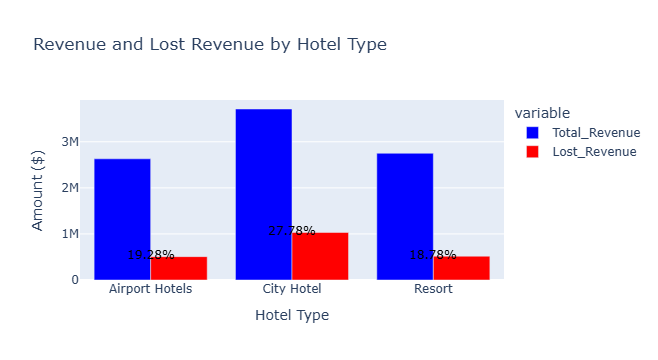

In [744]:
# Plotting using Plotly
fig = px.bar(revenue_summary, x='Hotel_Type', 
             y=['Total_Revenue', 'Lost_Revenue'], 
             title="Revenue and Lost Revenue by Hotel Type",
             labels={'value': 'Amount ($)', 'Hotel_Type': 'Hotel Type'},
             color_discrete_sequence=["blue", "red"])

fig.update_layout(barmode='group', xaxis_title="Hotel Type", yaxis_title="Amount ($)")

# Add text labels for the percentages on top of the bars (Lost Revenue Percentage)
for i, row in revenue_summary.iterrows():
    fig.add_annotation(
        x=row['Hotel_Type'],
        y=row['Lost_Revenue'] + 50000,  # Adjusting position for text
        text=f"{row['Lost_Revenue_Percentage']:.2f}%",
        showarrow=False,
        font=dict(size=12, color="black"),
        align="center"
    )

fig.show()


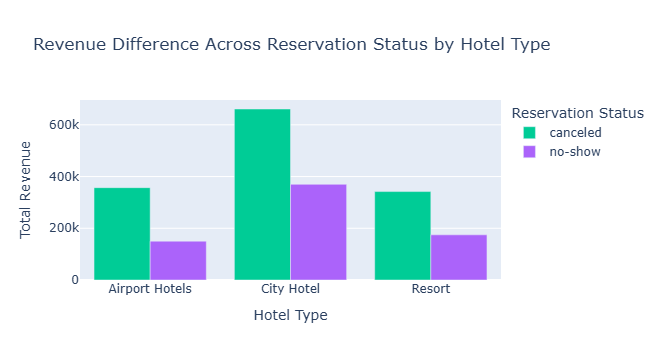

In [724]:
import pandas as pd
import plotly.express as px

# Assuming Hotel_A_Train_v1 is your DataFrame
# Filter the relevant rows for Cancel and No Show
filtered_data = Hotel_A_Train_v1[Hotel_A_Train_v1['Reservation_Status'].isin(['canceled', 'no-show'])]

# Group by Hotel Type and Reservation Status, then sum the revenue
revenue_by_status_and_type = filtered_data.groupby(['Hotel_Type', 'Reservation_Status'])['Revenue'].sum().reset_index()

# Create a grouped bar plot using Plotly
fig = px.bar(revenue_by_status_and_type,
             x='Hotel_Type',
             y='Revenue',
             color='Reservation_Status',
             barmode='group',
             title='Revenue Difference Across Reservation Status by Hotel Type',
             labels={'Revenue': 'Total Revenue', 'Hotel_Type': 'Hotel Type', 'Reservation_Status': 'Reservation Status'},
             color_discrete_map={'Cancel': 'red', 'No Show': 'orange'}  # Optional: You can customize colors
            )

# Show the plot
fig.show()


In [158]:
Hotel_A_Train_Preprocessed = Hotel_A_Train_v1.copy()

In [160]:
# Hotel_A_Train_Preprocessed.to_excel(r'C:\Users\8027115\Data Xplore\Stage 3\Reference Files\Output_2\Preprocessed.xlsx', index=False)

In [166]:
Discrete_Identifier = ['Reservation_ID','New_Reservation_ID']

Discrete = ['Age', 'Adults', 'Children','Babies', 'Discount_Rate',
            'Expected_checkin_year', 'Expected_checkin_month',
            'Expected_checkin_day', 'Expected_checkin_day_of_week',
            'Expected_checkout_year', 'Expected_checkout_month',
            'Expected_checkout_day', 'Checkout_day_of_week', 'Booking_date_year',
            'Booking_date_month', 'Booking_date_day', 'Booking_day_of_week',
            'No_of_Rooms', 
            'Duration_checkin_checkout', 'Booking_to_checkin_duration']

Continuous = ['Room_Rate', 'Revenue_with_disc_log']
Conts_exl = ['Revenue', 'Revenue_with_disc',]

Ordinal = ['Educational_Level', 'Income']

Nominal_Multi = ['Ethnicity', 'Country_region', 'Hotel_Type',
                  'Meal_Type', 'Deposit_type','Booking_channel']

Nominal_Binary = ['Gender', 'Visted_Previously',
                  'Previous_Cancellations', 'Required_Car_Parking','Use_Promotion']

Nominal_target_var = ['Reservation_Status']

Date = ['Expected_checkin','Expected_checkout', 'Booking_date']

In [168]:
from scipy.stats import skew

def check_skewness(dataframe, columns):
    skew_values = {}
    for col in columns:
        skew_values[col] = skew(dataframe[col])
    skewness_table = pd.DataFrame(list(skew_values.items()), columns=["Column", "Skewness"])
    return skewness_table
def style_skewness_table(skewness_table):
    def highlight_extreme(val):
        color = 'red' if abs(val) > 1 else ''  
        return f'background-color: {color}'
    return skewness_table.style.applymap(highlight_extreme, subset=['Skewness'])
A = check_skewness(Hotel_A_Train_Preprocessed, Discrete + Continuous)
style_skewness_table(A)

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\1318436326.py:13: FutureWarning:

Styler.applymap has been deprecated. Use Styler.map instead.



,Column,Skewness
0,Age,0.003685
1,Adults,0.818716
2,Children,0.428293
3,Babies,1.719931
4,Discount_Rate,0.864405
5,Expected_checkin_year,0.192828
6,Expected_checkin_month,0.051551
7,Expected_checkin_day,-0.024214
8,Expected_checkin_day_of_week,0.099761
9,Expected_checkout_year,0.187128


In [170]:
def unique_counts(df):
    num_unique = df.nunique().sort_values(ascending=False)
    pct_unique = ((df.nunique().sort_values(ascending=False) / len(df)) * 100).round(3)
    pct_unique = pct_unique.astype(str) + '%'
    
    unique = pd.DataFrame({
        'Unique Count': num_unique,
        'Percentage Unique': pct_unique
    })

    return unique

In [172]:
unique_counts(Hotel_A_Train_Preprocessed)

,Unique Count,Percentage Unique
New_Reservation_ID,27499,100.0%
Reservation_ID,27495,99.985%
Revenue_with_disc,22850,83.094%
Revenue_with_disc_log,22850,83.094%
Revenue,21604,78.563%
Room_Rate,21087,76.683%
Booking_date,1133,4.12%
Expected_checkout,929,3.378%
Expected_checkin,901,3.276%
Booking_to_checkin_duration,409,1.487%


In [174]:
Hotel_A_Train_Preprocessed.head(2)

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate,New_Reservation_ID,Expected_checkin_year,Expected_checkin_month,Expected_checkin_day,Expected_checkin_day_of_week,Expected_checkout_year,Expected_checkout_month,Expected_checkout_day,Checkout_day_of_week,Booking_date_year,Booking_date_month,Booking_date_day,Booking_day_of_week,Duration_checkin_checkout,Booking_to_checkin_duration,No_of_ppl_without_babies,No_of_Rooms,Revenue,Revenue_with_disc,Revenue_with_disc_log
2164,83542079,F,60,African American,Grad,<25K,East,Airport Hotels,2015-01-02,2015-01-05,2014-01-09,2,2,0,BB,Yes,No,Refundable,Direct,No,check-out,Yes,5,140.945048,1,2015,1,2,4,2015,1,5,0,2014,1,9,3,3,358,4,1,422.835144,401.693387,5.998175
2003,82695060,M,49,Latino,College,<25K,East,City Hotel,2015-01-02,2015-01-03,2014-01-14,1,2,2,BB,Yes,No,No Deposit,Online,Yes,check-out,Yes,0,128.429209,2,2015,1,2,4,2015,1,3,5,2014,1,14,1,1,353,3,1,128.429209,128.429209,4.863134


In [204]:
Hotel_A_Train_Preprocessed.groupby(['Gender','Ethnicity','Educational_Level','Income','Country_region','Age'])['Previous_Cancellations'].nunique().head(20)

Gender  Ethnicity         Educational_Level  Income     Country_region  Age
F       African American  College            25K --50K  East            18     1
                                                                        19     2
                                                                        20     1
                                                                        21     1
                                                                        22     1
                                                                        23     1
                                                                        24     1
                                                                        25     1
                                                                        26     2
                                                                        27     1
                                                                        28     1
                                 

In [ ]:
mode_babies_by_group = babies_non_null.groupby(['Hotel_Type', 'Income', 'Visted_Previously', 'Required_Car_Parking', 'Gender'])['Babies'].agg(lambda x: x.mode()[0]).reset_index()

In [346]:
Hotel_A_Train_v2 = Hotel_A_Train_v1.copy()

In [208]:
Hotel_A_Train_v2.columns

Index(['Reservation_ID', 'Gender', 'Age', 'Ethnicity', 'Educational_Level',
       'Income', 'Country_region', 'Hotel_Type', 'Expected_checkin',
       'Expected_checkout', 'Booking_date', 'Adults', 'Children', 'Babies',
       'Meal_Type', 'Visted_Previously', 'Previous_Cancellations',
       'Deposit_type', 'Booking_channel', 'Required_Car_Parking',
       'Reservation_Status', 'Use_Promotion', 'Discount_Rate', 'Room_Rate',
       'New_Reservation_ID', 'Expected_checkin_year', 'Expected_checkin_month',
       'Expected_checkin_day', 'Expected_checkin_day_of_week',
       'Expected_checkout_year', 'Expected_checkout_month',
       'Expected_checkout_day', 'Checkout_day_of_week', 'Booking_date_year',
       'Booking_date_month', 'Booking_date_day', 'Booking_day_of_week',
       'Duration_checkin_checkout', 'Booking_to_checkin_duration',
       'No_of_ppl_without_babies', 'No_of_Rooms', 'Revenue',
       'Revenue_with_disc', 'Revenue_with_disc_log'],
      dtype='object')

In [210]:
def map_target_variable(data):
    data['Reservation_Status'] = data['Reservation_Status'].map({'check-out': 1, 'canceled': 2, 'no-show': 3})
    return data

In [348]:
Hotel_A_Train_v2 = map_target_variable(Hotel_A_Train_v2)

### Correlation

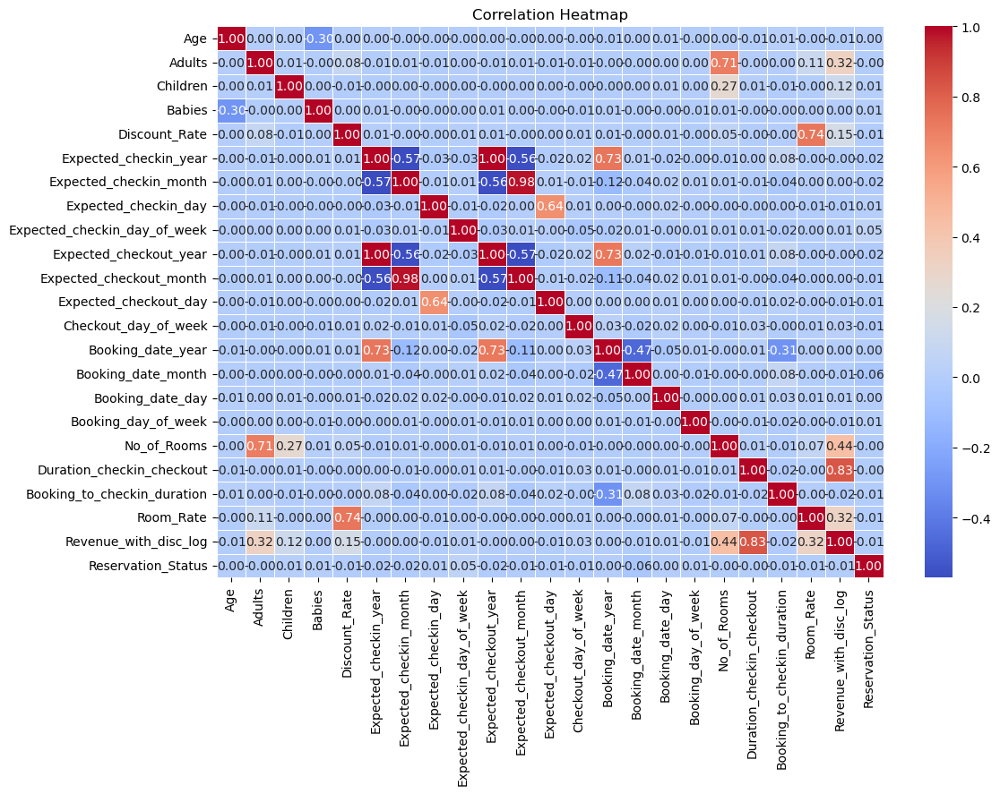

In [215]:
def plot_correlation_heatmap(df, num_features):
    
    corr = df[num_features].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title('Correlation Heatmap')
    plt.show()   

plot_correlation_heatmap(Hotel_A_Train_v2, Discrete + Continuous + ['Reservation_Status'])

In [216]:
def num_plot_dist(df, num_features):
        fig, axes = plt.subplots(len(num_features), 2, figsize=(15, len(num_features) * 5))
        if len(num_features) == 1:
            axes = [axes] 
        for i, column in enumerate(num_features):
            sns.histplot(data=df, x=column, ax=axes[i][0], kde=True, palette="Blues")
            axes[i][0].set_title(f'Histogram with KDE for {column}')
            
            sns.boxplot(data=df, x=column, ax=axes[i][1], palette="Blues")
            axes[i][1].set_title(f'Box Plot for {column}')
        
        plt.tight_layout()
        plt.show()

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\703421397.py:6: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\703421397.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\703421397.py:6: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\703421397.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\703421397.py:6: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\7

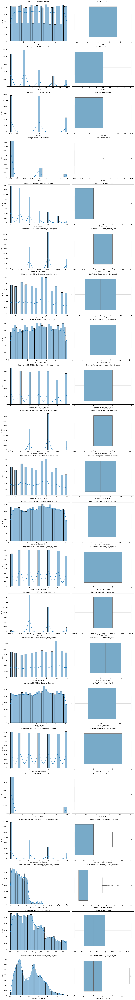

In [219]:
num_plot_dist(Hotel_A_Train_v2, Discrete + Continuous)

In [220]:
status_count = Hotel_A_Train_v2['Reservation_Status'].value_counts().reset_index()
status_count.columns = ['Status', 'Count']
status_count['Percentage'] = (status_count['Count'] / status_count['Count'].sum()) * 100

In [221]:
fig = px.bar(
    status_count,
    x='Status', 
    y='Count',
    labels={'Status': 'Status', 'Count': 'Count'},
    title='Count of Status'
)
for i, row in status_count.iterrows():
    fig.add_annotation(
        x=row['Status'],
        y=row['Count'],
        text=f"{row['Percentage']:.1f}%",  
        showarrow=False,
        font=dict(size=14, color="black"),
        align="center",
        yshift=10  
    )

fig.update_layout(
    xaxis=dict(
        # tickmode='array',
        tickvals=babies_count['Number of Babies'],  
        ticktext=babies_count['Number of Babies']
    )
)

fig.show()


## 2. EDA Ctd

In [751]:
df = Hotel_A_Train_v2.copy()

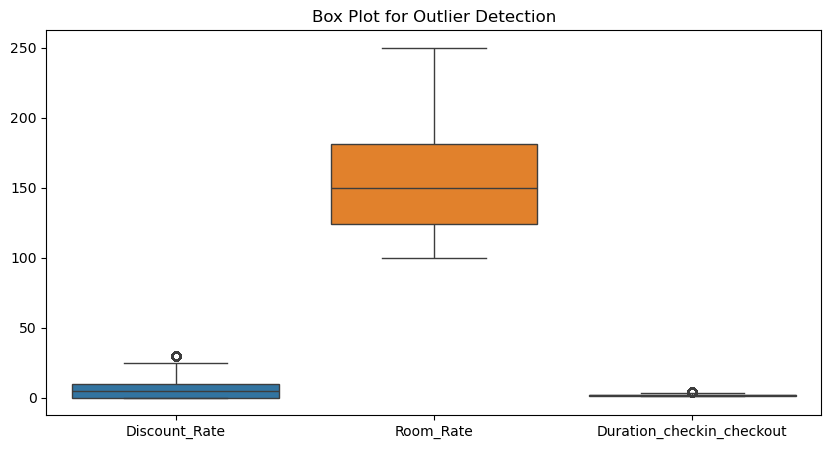

In [753]:
columns_to_check = ['Discount_Rate', 'Room_Rate','Duration_checkin_checkout']

# Box Plot for Outliers
plt.figure(figsize=(10, 5))
sns.boxplot(data=df[columns_to_check])
plt.title('Box Plot for Outlier Detection')
plt.show()

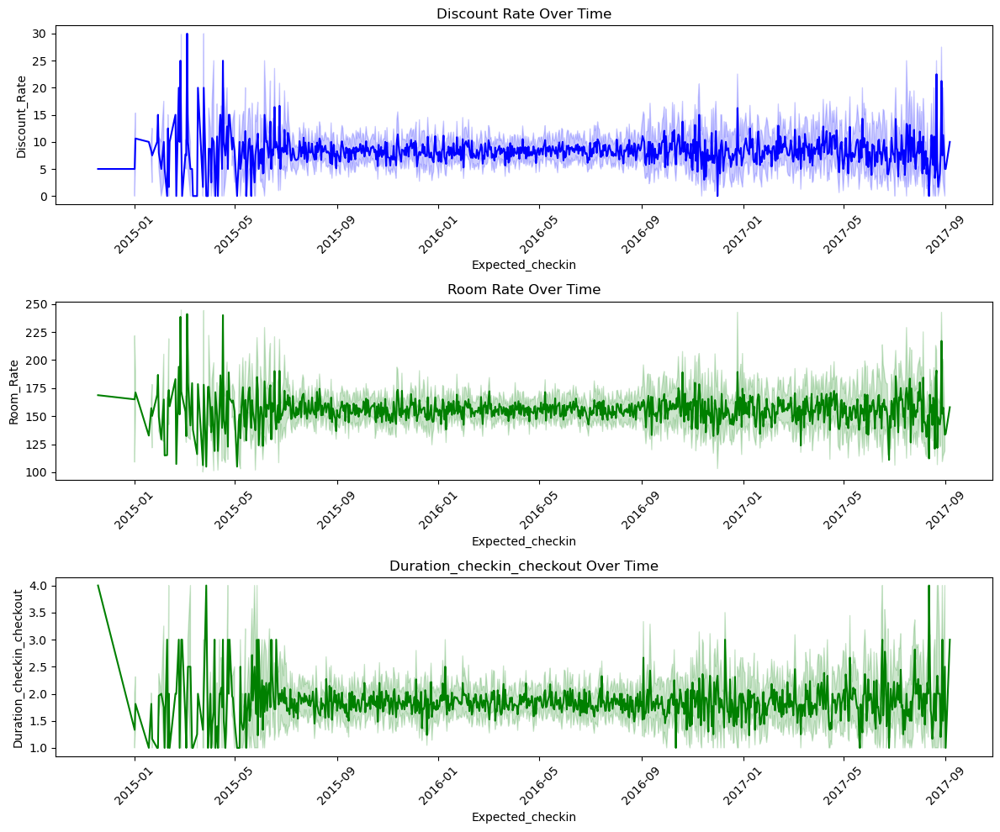

In [755]:
plt.figure(figsize=(12, 10))

# Line Plot for Discount Rate
plt.subplot(3, 1, 1)  # (rows, columns, index)
sns.lineplot(data=df, x='Expected_checkin', y='Discount_Rate', color='blue')
plt.xticks(rotation=45)
plt.title('Discount Rate Over Time')

# Line Plot for Room Rate
plt.subplot(3, 1, 2)
sns.lineplot(data=df, x='Expected_checkin', y='Room_Rate', color='green')
plt.xticks(rotation=45)
plt.title('Room Rate Over Time')

plt.subplot(3, 1, 3)
sns.lineplot(data=df, x='Expected_checkin', y='Duration_checkin_checkout', color='green')
plt.xticks(rotation=45)
plt.title('Duration_checkin_checkout Over Time')
# Adjust layout
plt.tight_layout()
plt.show()

**Bivariate Analysis - Do some hotel types have higher cancellation/no-show rates?**

In [760]:
import scipy.stats as stats
contingency_table = pd.crosstab(df['Hotel_Type'], df['Reservation_Status'])
print("\nContingency Table:\n", contingency_table)

chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.5f}")


Contingency Table:
 Reservation_Status     1     2     3
Hotel_Type                          
Airport Hotels      7434  1240   531
City Hotel          8496  2067  1168
Resort              5310   827   426

Chi-Square Test Results:
Chi-Square Statistic: 288.55
Degrees of Freedom: 4
P-value: 0.00000


In [764]:
alpha = 0.05  # Significance level
if p < alpha:
    print("\n🔴 Reject Null Hypothesis: Reservation status significantly differs between hotel types.")
else:
    print("\n🟢 Fail to Reject Null Hypothesis: No significant difference in reservation status distribution.")


🔴 Reject Null Hypothesis: Reservation status significantly differs between hotel types.


In [766]:
contingency_table = pd.crosstab(df['Previous_Cancellations'], df['Reservation_Status'])
print("\nContingency Table:\n", contingency_table)
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.5f}")


Contingency Table:
 Reservation_Status          1     2     3
Previous_Cancellations                   
No                      18804  3692  1883
Yes                      2436   442   242

Chi-Square Test Results:
Chi-Square Statistic: 2.08
Degrees of Freedom: 2
P-value: 0.35316


In [768]:
contingency_table = pd.crosstab(df['Booking_to_checkin_duration'], df['Reservation_Status'],margins=True, margins_name="Total")
print("\nContingency Table:\n", contingency_table)


Contingency Table:
 Reservation_Status               1     2     3  Total
Booking_to_checkin_duration                          
-4                              22     1     0     23
-3                              70     5     2     77
-2                             124     4     4    132
-1                             247    16    11    274
0                              149    17     7    173
...                            ...   ...   ...    ...
538                              3     0     0      3
540                              2     0     0      2
541                              5     0     0      5
708                              1     0     0      1
Total                        21240  4134  2125  27499

[410 rows x 4 columns]


In [770]:
status_col = 'Reservation_Status'  # e.g., 'Reservation_Status' (Check-Out, Cancel, No-Show)
duration_col = 'Booking_to_checkin_duration'  # e.g., 'Booking_Duration' (Number of days between booking and check-in)

# Check if columns exist in the dataset
if status_col not in df.columns or duration_col not in df.columns:
    print("Error: Column names do not match dataset.")
else:
    # Group data by Reservation Status and extract booking duration values
    status_groups = [df[duration_col][df[status_col] == status] for status in df[status_col].unique()]

    # Perform ANOVA test
    f_stat, p_value = stats.f_oneway(*status_groups)

    # Output results
    print("\nANOVA Test Results:")
    print(f"F-Statistic: {f_stat:.2f}")
    print(f"P-value: {p_value:.5f}")


ANOVA Test Results:
F-Statistic: 0.48
P-value: 0.61848


C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\1658811193.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




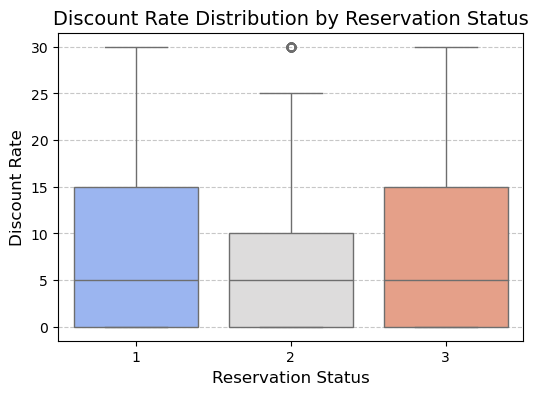

In [772]:
# Replace with actual column names
status_col = 'Reservation_Status'  # e.g., 'Reservation_Status' (Check-Out, Cancel, No-Show)
discount_col = 'Discount_Rate'  # e.g., 'Discount_Rate' (numeric values)

# Check if columns exist in the dataset
if status_col not in df.columns or discount_col not in df.columns:
    print("Error: Column names do not match dataset.")
else:
    # Create the box plot
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[status_col], y=df[discount_col], palette="coolwarm")

    # Customize the plot
    plt.title("Discount Rate Distribution by Reservation Status", fontsize=14)
    plt.xlabel("Reservation Status", fontsize=12)
    plt.ylabel("Discount Rate", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show the plot
    plt.show()

In [774]:
status_col = 'Reservation_Status'  # e.g., 'Reservation_Status' (Check-Out, Cancel, No-Show)
duration_col = 'Discount_Rate'  # e.g., 'Booking_Duration' (Number of days between booking and check-in)

# Check if columns exist in the dataset
if status_col not in df.columns or duration_col not in df.columns:
    print("Error: Column names do not match dataset.")
else:
    # Group data by Reservation Status and extract booking duration values
    status_groups = [df[duration_col][df[status_col] == status] for status in df[status_col].unique()]

    # Perform ANOVA test
    f_stat, p_value = stats.f_oneway(*status_groups)

    # Output results
    print("\nANOVA Test Results:")
    print(f"F-Statistic: {f_stat:.2f}")
    print(f"P-value: {p_value:.5f}")


ANOVA Test Results:
F-Statistic: 1.66
P-value: 0.18997


In [776]:
contingency_table = pd.crosstab(df['Deposit_type'], df['Reservation_Status'])
print("\nContingency Table:\n", contingency_table)
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.5f}")


Contingency Table:
 Reservation_Status      1     2     3
Deposit_type                         
No Deposit          10620  2895  1276
Non-Refundable       6372   826   743
Refundable           4248   413   106

Chi-Square Test Results:
Chi-Square Statistic: 827.25
Degrees of Freedom: 4
P-value: 0.00000


In [778]:
contingency_table = pd.crosstab(df['Deposit_type'], df['Reservation_Status'], margins=True, margins_name="Total")
print("\nContingency Table:\n", contingency_table)


Contingency Table:
 Reservation_Status      1     2     3  Total
Deposit_type                                
No Deposit          10620  2895  1276  14791
Non-Refundable       6372   826   743   7941
Refundable           4248   413   106   4767
Total               21240  4134  2125  27499


C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\460582507.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




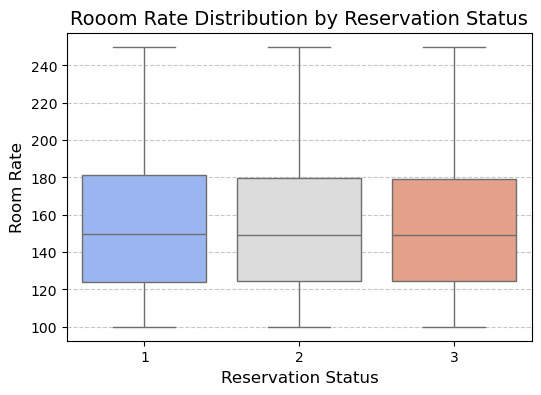

In [780]:
# Replace with actual column names
status_col = 'Reservation_Status'  # e.g., 'Reservation_Status' (Check-Out, Cancel, No-Show)
discount_col = 'Room_Rate'  # e.g., 'Discount_Rate' (numeric values)

# Check if columns exist in the dataset
if status_col not in df.columns or discount_col not in df.columns:
    print("Error: Column names do not match dataset.")
else:
    # Create the box plot
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[status_col], y=df[discount_col], palette="coolwarm")

    # Customize the plot
    plt.title("Rooom Rate Distribution by Reservation Status", fontsize=14)
    plt.xlabel("Reservation Status", fontsize=12)
    plt.ylabel("Room Rate", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show the plot
    plt.show()

In [782]:
status_col = 'Reservation_Status'  # e.g., 'Reservation_Status' (Check-Out, Cancel, No-Show)
duration_col = 'Room_Rate'  # e.g., 'Booking_Duration' (Number of days between booking and check-in)

# Check if columns exist in the dataset
if status_col not in df.columns or duration_col not in df.columns:
    print("Error: Column names do not match dataset.")
else:
    # Group data by Reservation Status and extract booking duration values
    status_groups = [df[duration_col][df[status_col] == status] for status in df[status_col].unique()]

    # Perform ANOVA test
    f_stat, p_value = stats.f_oneway(*status_groups)

    # Output results
    print("\nANOVA Test Results:")
    print(f"F-Statistic: {f_stat:.2f}")
    print(f"P-value: {p_value:.5f}")


ANOVA Test Results:
F-Statistic: 2.04
P-value: 0.12968


In [812]:
cancellation_counts = df[df['Reservation_Status'] == 2].groupby('Expected_checkout_month').size()
total_counts = df.groupby('Expected_checkout_month').size()
# Calculate cancellation rate
cancellation_rate = (cancellation_counts / total_counts) * 100

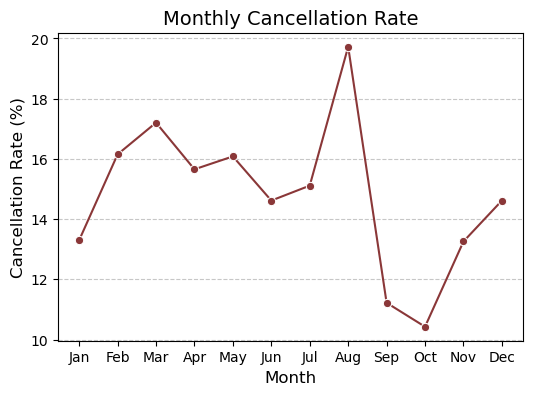

In [814]:
plt.figure(figsize=(6,4))
sns.lineplot(x=cancellation_rate.index, y=cancellation_rate.values, marker="o", color="#8A3738")

# Customize the plot
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.title("Monthly Cancellation Rate", fontsize=14)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Cancellation Rate (%)", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

In [816]:
contingency_table = pd.crosstab(index=df['Expected_checkout_month'], columns=df['Reservation_Status'])

# Perform Chi-Square test
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

# Print results
print("\nContingency Table:\n", contingency_table)
print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.5f}")


Contingency Table:
 Reservation_Status          1    2    3
Expected_checkout_month                
1                        1863  312  171
2                        1618  343  163
3                        1980  455  210
4                        1838  373  172
5                        1751  371  185
6                        1653  311  164
7                        2215  437  240
8                        2146  599  292
9                        1579  216  130
10                       1890  235  129
11                       1371  228  121
12                       1336  254  148

Chi-Square Test Results:
Chi-Square Statistic: 190.85
Degrees of Freedom: 22
P-value: 0.00000


C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\3250717742.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\3250717742.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\3250717742.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\3250717742.py:14: FutureWa

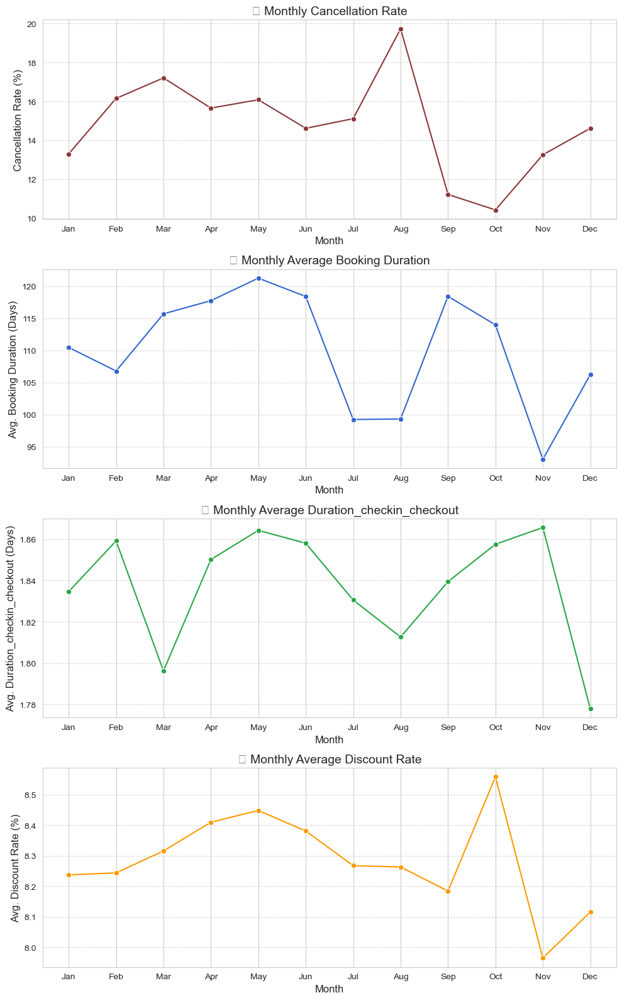

In [822]:
df['Expected_checkout_month'] = pd.Categorical(df['Expected_checkout_month'], 
                                               categories=range(1, 13), 
                                               ordered=True)

# 📌 Calculate Cancellation Rate by Month
cancellation_counts = df[df['Reservation_Status'] == 2].groupby('Expected_checkout_month').size()
total_counts = df.groupby('Expected_checkout_month').size()
cancellation_rate = (cancellation_counts / total_counts) * 100

# 📌 Calculate Average Booking Duration (Days between reservation & check-in)
avg_booking_duration = df.groupby('Expected_checkout_month')['Booking_to_checkin_duration'].mean()

# 📌 Calculate Average Stay Duration (Check-in to check-out)
avg_stay_duration = df.groupby('Expected_checkout_month')['Duration_checkin_checkout'].mean()

# 📌 Calculate Average Discount Rate by Month
avg_discount = df.groupby('Expected_checkout_month')['Discount_Rate'].mean()

# Set plot style
sns.set_style("whitegrid")

# Create figure with subplots
fig, axes = plt.subplots(4, 1, figsize=(10, 16))

# 🔹 Cancellation Rate Line Plot
sns.lineplot(x=cancellation_rate.index, y=cancellation_rate.values, marker="o", color="#8A3738", ax=axes[0])
axes[0].set_title("📉 Monthly Cancellation Rate", fontsize=14)
axes[0].set_xlabel("Month", fontsize=12)
axes[0].set_ylabel("Cancellation Rate (%)", fontsize=12)
axes[0].set_xticks(range(1, 13))
axes[0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[0].grid(axis="y", linestyle="--", alpha=0.7)

# 🔹 Booking Duration Line Plot
sns.lineplot(x=avg_booking_duration.index, y=avg_booking_duration.values, marker="o", color="#3366CC", ax=axes[1])
axes[1].set_title("📅 Monthly Average Booking Duration", fontsize=14)
axes[1].set_xlabel("Month", fontsize=12)
axes[1].set_ylabel("Avg. Booking Duration (Days)", fontsize=12)
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[1].grid(axis="y", linestyle="--", alpha=0.7)

# 🔹 Stay Duration Line Plot
sns.lineplot(x=avg_stay_duration.index, y=avg_stay_duration.values, marker="o", color="#28A745", ax=axes[2])
axes[2].set_title("🏨 Monthly Average Duration_checkin_checkout", fontsize=14)
axes[2].set_xlabel("Month", fontsize=12)
axes[2].set_ylabel("Avg. Duration_checkin_checkout (Days)", fontsize=12)
axes[2].set_xticks(range(1, 13))
axes[2].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[2].grid(axis="y", linestyle="--", alpha=0.7)

# 🔹 Discount Rate Line Plot
sns.lineplot(x=avg_discount.index, y=avg_discount.values, marker="o", color="#FF9900", ax=axes[3])
axes[3].set_title("💰 Monthly Average Discount Rate", fontsize=14)
axes[3].set_xlabel("Month", fontsize=12)
axes[3].set_ylabel("Avg. Discount Rate (%)", fontsize=12)
axes[3].set_xticks(range(1, 13))
axes[3].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[3].grid(axis="y", linestyle="--", alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()

C:\Users\8027115\AppData\Local\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.



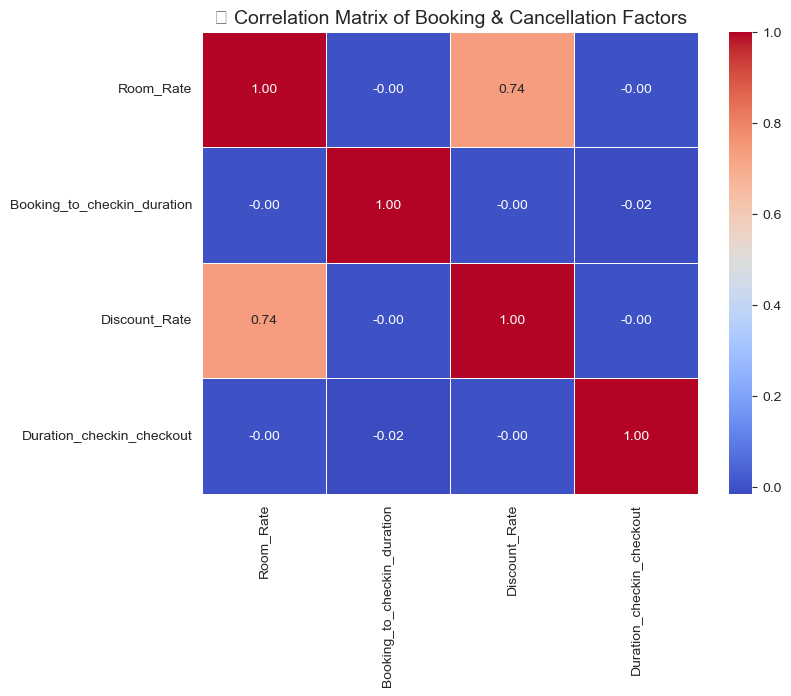

In [824]:
corr_columns = ['Room_Rate', 'Booking_to_checkin_duration', 'Discount_Rate', 'Duration_checkin_checkout']
corr_df = df[corr_columns].dropna()  # Remove any missing values

# 🔹 Compute correlation matrix
correlation_matrix = corr_df.corr()

# 🔹 Plot heatmap to visualize correlations
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("📊 Correlation Matrix of Booking & Cancellation Factors", fontsize=14)
plt.show()

In [838]:
canceled_no_show_df = df[df['Reservation_Status'].isin([2, 3])]

total_revenue_loss = canceled_no_show_df['Revenue'].sum()
total_revenue_loss_with_discount = canceled_no_show_df['Revenue_with_disc'].sum()

In [840]:
monthly_loss = canceled_no_show_df.groupby('Expected_checkin_month')['Revenue'].sum()

# Breakdown by hotel type
hotel_loss = canceled_no_show_df.groupby('Hotel_Type')['Revenue'].sum()

# Breakdown by booking channel
booking_channel_loss = canceled_no_show_df.groupby('Booking_channel')['Revenue'].sum()

# Breakdown by deposit type
deposit_loss = canceled_no_show_df.groupby('Deposit_type')['Revenue'].sum()

# Print results
print(f"Total Revenue Loss (No Discounts): ${total_revenue_loss:,.2f}")
print(f"Total Revenue Loss (With Discounts): ${total_revenue_loss_with_discount:,.2f}")
print("\nMonthly Revenue Loss:")
print(monthly_loss)
print("\nRevenue Loss by Hotel Type:")
print(hotel_loss)
print("\nRevenue Loss by Booking Channel:")
print(booking_channel_loss)
print("\nRevenue Loss by Deposit Type:")
print(deposit_loss)

Total Revenue Loss (No Discounts): $2,054,757.77
Total Revenue Loss (With Discounts): $1,857,965.52

Monthly Revenue Loss:
Expected_checkin_month
1     166184.101356
2     175041.944450
3     195445.735064
4     188698.676865
5     180401.727958
6     163406.611806
7     242026.484718
8     288920.219244
9      96305.526225
10    111782.373166
11    118997.248128
12    127547.119786
Name: Revenue, dtype: float64

Revenue Loss by Hotel Type:
Hotel_Type
Airport Hotels    5.071008e+05
City Hotel        1.031132e+06
Resort            5.165250e+05
Name: Revenue, dtype: float64

Revenue Loss by Booking Channel:
Booking_channel
Agent     2.891945e+05
Direct    6.077650e+05
Online    1.157798e+06
Name: Revenue, dtype: float64

Revenue Loss by Deposit Type:
Deposit_type
No Deposit        1.306449e+06
Non-Refundable    6.030977e+05
Refundable        1.452112e+05
Name: Revenue, dtype: float64


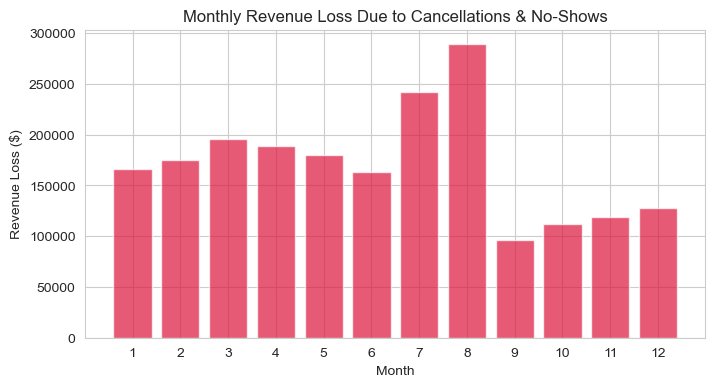

In [842]:
monthly_revenue_loss = {
    1: 166184.10, 2: 175041.94, 3: 195445.73, 4: 188698.67, 5: 180401.72, 
    6: 163406.61, 7: 242026.48, 8: 288920.21, 9: 96305.52, 10: 111782.37, 
    11: 118997.24, 12: 127547.11
}

# Convert to DataFrame
df1 = pd.DataFrame(list(monthly_revenue_loss.items()), columns=["Month", "Revenue Loss"])

# Plot
plt.figure(figsize=(8, 4))
plt.bar(df1["Month"], df1["Revenue Loss"], color="crimson", alpha=0.7)

# Labels and Title
plt.xlabel("Month")
plt.ylabel("Revenue Loss ($)")
plt.title("Monthly Revenue Loss Due to Cancellations & No-Shows")
plt.xticks(range(1, 13))  # Ensure months are displayed as 1 to 12

# Show plot
plt.show()

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\43499234.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




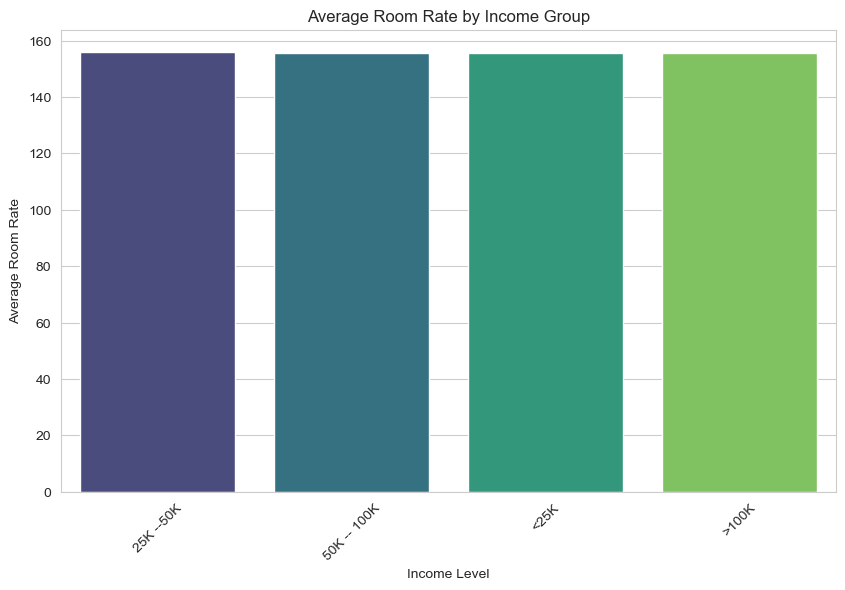

In [844]:
avg_room_rate = df.groupby('Income')['Room_Rate'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='Income', y='Room_Rate', data=avg_room_rate, palette='viridis')
plt.title('Average Room Rate by Income Group')
plt.xlabel('Income Level')
plt.ylabel('Average Room Rate')
plt.xticks(rotation=45)
plt.show()


In [848]:
from scipy.stats import spearmanr
df['Income_Cat'] = df['Income'].astype('category').cat.codes

# Spearman correlation test
stat, p_value = spearmanr(df['Income_Cat'], df['Room_Rate'])
print("Spearman Correlation p-value:", p_value)

Spearman Correlation p-value: 0.8425418806487996


## 4. Classification

In [243]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

In [417]:
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score

**Preprocessor**

In [166]:
Discrete_Identifier = ['Reservation_ID','New_Reservation_ID']

Discrete = ['Age', 'Adults', 'Children','Babies', 'Discount_Rate',
            'Expected_checkin_year', 'Expected_checkin_month',
            'Expected_checkin_day', 'Expected_checkin_day_of_week',
            'Expected_checkout_year', 'Expected_checkout_month',
            'Expected_checkout_day', 'Checkout_day_of_week', 'Booking_date_year',
            'Booking_date_month', 'Booking_date_day', 'Booking_day_of_week',
            'No_of_Rooms', 
            'Duration_checkin_checkout', 'Booking_to_checkin_duration']

Continuous = ['Room_Rate', 'Revenue_with_disc_log']
Conts_exl = ['Revenue', 'Revenue_with_disc',]

Ordinal = ['Educational_Level', 'Income']

Nominal_Multi = ['Ethnicity', 'Country_region', 'Hotel_Type',
                  'Meal_Type', 'Deposit_type','Booking_channel']

Nominal_Binary = ['Gender', 'Visted_Previously',
                  'Previous_Cancellations', 'Required_Car_Parking','Use_Promotion']

Nominal_target_var = ['Reservation_Status']

Date = ['Expected_checkin','Expected_checkout', 'Booking_date']

In [223]:
scaler = StandardScaler()
education_order = ['Mid-School', 'High-School', 'College', 'Grad']
income_order = ['<25K', '25K --50K', '50K -- 100K', '>100K']
ordinal_encoder = OrdinalEncoder(categories=[education_order, income_order])
label_encoder = LabelEncoder()
onehot_encoder = OneHotEncoder(drop='first', sparse_output=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', scaler, Continuous),
        ('ordinal', ordinal_encoder, Ordinal),
        ('binary', OneHotEncoder(drop='first', sparse_output=False), Nominal_Binary),
        ('multi', onehot_encoder, Nominal_Multi),
    ]
)

In [714]:
preprocessor

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['Room_Rate', 'Revenue_with_disc_log']),
                                ('ordinal',
                                 OrdinalEncoder(categories=[['Mid-School',
                                                             'High-School',
                                                             'College',
                                                             'Grad'],
                                                            ['<25K',
                                                             '25K --50K',
                                                             '50K -- 100K',
                                                             '>100K']]),
                                 ['Educational_Level', 'Income']),
                                ('binary',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Gender', 'Visted_Previously',
                                  'Previous_Cancellations',
                                  'Required_Car_Parking', 'Use_Promotion']),
                                ('multi',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Ethnicity', 'Country_region', 'Hotel_Type',
                                  'Meal_Type', 'Deposit_type',
                                  'Booking_channel'])])

In [227]:
models = [
    ('Random Forest', RandomForestClassifier(class_weight='balanced', random_state=42)),
    ('Logistic Regression', LogisticRegression(max_iter=1000, random_state=42)),
    ('SVC', SVC(class_weight='balanced', random_state=42)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42))
    # Add more classifiers like XGBoost or LightGBM if installed
    # ('XGBoost', XGBClassifier(random_state=42)),
    # ('LightGBM', LGBMClassifier(random_state=42))
]

In [746]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix

# Assuming `models` and `preprocessor` are already defined

def compare_models(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Lists to store the accuracy results
    model_names = []
    train_accuracies = []
    test_accuracies = []

    for model_name, model in models:
        print(f"Training {model_name}...")
        
        pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),  # Apply preprocessing
            ('model', model)  # Model
        ])
        
        # Train the model
        pipeline.fit(X_train, y_train)
        
        # Predict and evaluate the model
        y_pred_train = pipeline.predict(X_train)
        y_pred_test = pipeline.predict(X_test)
        
        # Calculate the accuracy
        train_acc = accuracy_score(y_train, y_pred_train)
        test_acc = accuracy_score(y_test, y_pred_test)

        # Store the results
        model_names.append(model_name)
        train_accuracies.append(train_acc)
        test_accuracies.append(test_acc)
        
        # Print the results for each model
        print(f"Results for {model_name}:")
        print(classification_report(y_test, y_pred_test))
        print(confusion_matrix(y_test, y_pred_test))
        print("="*60)
    
    # Plotting the results
    fig, ax = plt.subplots(figsize=(10, 6))
    x = range(len(model_names))  # The position of the bars
    width = 0.35  # Width of the bars
    
    # Create bars for Train and Test accuracies
    ax.bar(x, train_accuracies, width, label='Train Accuracy', color='blue')
    ax.bar([p + width for p in x], test_accuracies, width, label='Test Accuracy', color='orange')
    
    # Adding labels, title, and ticks
    ax.set_xlabel('Models')
    ax.set_ylabel('Accuracy')
    ax.set_title('Model Comparison: Train vs Test Accuracy')
    ax.set_xticks([p + width/2 for p in x])
    ax.set_xticklabels(model_names, rotation=45, ha="right")
    ax.legend()
    
    # Show the plot
    plt.tight_layout()
    plt.show()


In [233]:
required_columns = Discrete + Continuous + Ordinal + Nominal_Multi + Nominal_Binary + Nominal_target_var

In [852]:
def X_Y_Decision(df):
    df = df[required_columns]
    X = df.drop('Reservation_Status', axis=1)
    y = df['Reservation_Status']
    return X, y

In [854]:
X, y = X_Y_Decision(Hotel_A_Train_v2)

**Comparing Multiple Models on the avaialbale training data**

Training Random Forest...
Results for Random Forest:
              precision    recall  f1-score   support

           1       0.86      0.95      0.90      6384
           2       0.63      0.45      0.53      1270
           3       0.51      0.28      0.36       596

    accuracy                           0.82      8250
   macro avg       0.67      0.56      0.60      8250
weighted avg       0.80      0.82      0.81      8250

[[6068  233   83]
 [ 624  571   75]
 [ 335   97  164]]
Training Logistic Regression...
Results for Logistic Regression:
              precision    recall  f1-score   support

           1       0.87      0.96      0.91      6384
           2       0.67      0.48      0.56      1270
           3       0.62      0.30      0.40       596

    accuracy                           0.84      8250
   macro avg       0.72      0.58      0.62      8250
weighted avg       0.82      0.84      0.82      8250

[[6133  203   48]
 [ 596  612   62]
 [ 326   94  176]]
Training S

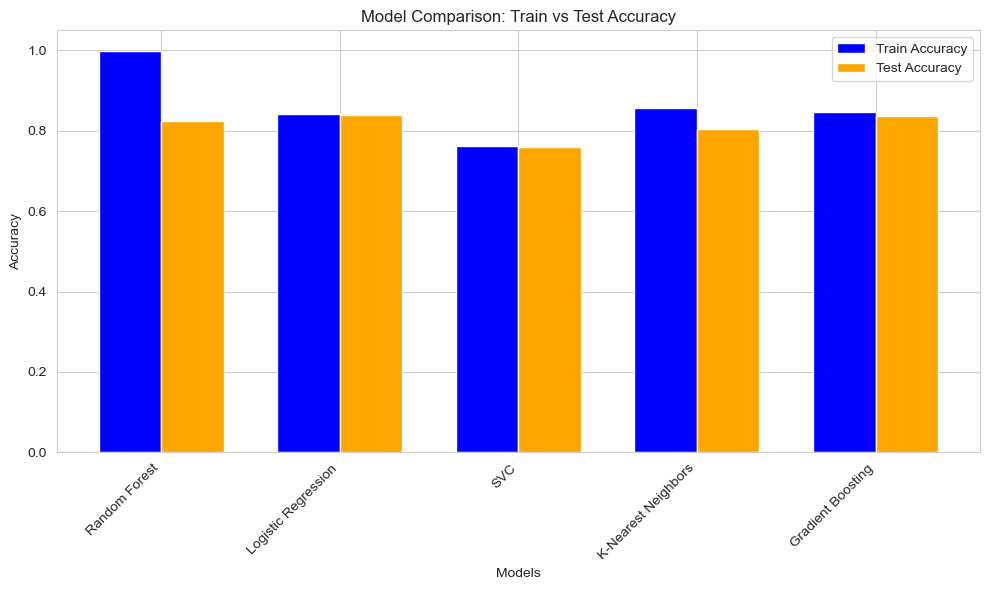

In [856]:
compare_models(X, y)

* Class imbalances casues sever issue in f1 score

**SMOTE**

In [240]:
def apply_smote_and_train(df):
    df = df[required_columns]
    X = df.drop('Reservation_Status', axis=1)
    y = df['Reservation_Status']  # Replace 'Reservation_Status' with your target column

    X_processed = preprocessor.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.3, random_state=42)
    oversample = SMOTE()
    X_resampled, y_resampled = oversample.fit_resample(X_processed, y)
    # Define models to compare
    models = [
        ('Random Forest', RandomForestClassifier(class_weight='balanced', random_state=42)),
        ('Logistic Regression', LogisticRegression(random_state=42)),
        #('SVC', SVC(class_weight='balanced', random_state=42)),
        ('K-Nearest Neighbors', KNeighborsClassifier()),
        ('Gradient Boosting', GradientBoostingClassifier(random_state=42))
    ]

    # Loop through models, train and evaluate
    for name, model in models:
        print(f"Training and evaluating {name}...")
        
        # Define a new pipeline for each model
        pipeline = Pipeline(steps=[
            #('preprocessor', preprocessor),  # Apply preprocessing
            ('model', model)  # Model
        ])
        
        # Train the model with resampled data (X_resampled, y_resampled)
        pipeline.fit(X_resampled, y_resampled)
        
        # Predict on the test data
        y_pred = pipeline.predict(X_test)
        
        # Evaluate the model
        print(f"Classification report for {name}:")
        print(classification_report(y_test, y_pred))
        print(f"Confusion matrix for {name}:")
        print(confusion_matrix(y_test, y_pred))



In [513]:
apply_smote_and_train(Hotel_A_Train_v2) 

Training and evaluating Random Forest...
Classification report for Random Forest:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      6384
           2       1.00      1.00      1.00      1270
           3       1.00      1.00      1.00       596

    accuracy                           1.00      8250
   macro avg       1.00      1.00      1.00      8250
weighted avg       1.00      1.00      1.00      8250

Confusion matrix for Random Forest:
[[6384    0    0]
 [   0 1270    0]
 [   1    0  595]]
Training and evaluating Logistic Regression...


C:\Users\8027115\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Classification report for Logistic Regression:
              precision    recall  f1-score   support

           1       0.98      0.77      0.87      6384
           2       0.51      0.68      0.59      1270
           3       0.31      0.80      0.44       596

    accuracy                           0.76      8250
   macro avg       0.60      0.75      0.63      8250
weighted avg       0.86      0.76      0.79      8250

Confusion matrix for Logistic Regression:
[[4926  735  723]
 [  41  868  361]
 [  35   85  476]]
Training and evaluating K-Nearest Neighbors...
Classification report for K-Nearest Neighbors:
              precision    recall  f1-score   support

           1       1.00      0.82      0.90      6384
           2       0.64      0.98      0.78      1270
           3       0.54      0.99      0.70       596

    accuracy                           0.85      8250
   macro avg       0.73      0.93      0.79      8250
weighted avg       0.91      0.85      0.87      8250



* SMOTE helps balances the classes

### Classification on Complete Dataset

In [549]:
Test_data_Hotel = pd.read_csv(r"C:\Users\8027115\Data Xplore\Stage 3\Reference Files\Docs Provided\Hotel-A-validation.csv")

In [551]:
Test_data_Hotel_v1 = feature_engineering(Test_data_Hotel)

In [553]:
Test_data_Hotel_v1.head(2)

,Reservation-id,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate,Expected_checkin_year,Expected_checkin_month,Expected_checkin_day,Expected_checkin_day_of_week,Expected_checkout_year,Expected_checkout_month,Expected_checkout_day,Checkout_day_of_week,Booking_date_year,Booking_date_month,Booking_date_day,Booking_day_of_week,Duration_checkin_checkout,Booking_to_checkin_duration,No_of_ppl_without_babies,No_of_Rooms,Revenue,Revenue_with_disc,Revenue_with_disc_log
0,45716350,M,56,Latino,College,<25K,West,City Hotel,2016-08-31,2016-09-02,2016-02-18,2,2,0.0,HB,No,No,No Deposit,Agent,No,no-show,No,5,184.382579,2016,8,31,2,2016,9,2,4,2016,2,18,3,2,195,4,1,368.765158,350.326900,5.861717
1,88857401,M,60,caucasian,Mid-School,25K --50K,West,City Hotel,2016-08-31,2016-09-04,2016-03-09,2,2,0.0,FB,Yes,No,No Deposit,Online,Yes,canceled,No,20,203.886849,2016,8,31,2,2016,9,4,6,2016,3,9,2,4,175,4,1,815.547396,652.437917,6.482248


In [555]:
def preprocess_cols(df):
    x_cols = [col for col in required_columns if col not in Nominal_target_var]
    X_new = df[x_cols]  
    df['Reservation_Status'] = df['Reservation_Status'].replace({'check-in':1,  'canceled':2,  'no-show':3})
    return df
Test_data_Hotel_v1 = preprocess_cols(Test_data_Hotel_v1)

C:\Users\8027115\AppData\Local\Temp\ipykernel_13264\1016291781.py:4: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [557]:
Test_data_Hotel_v1.head(2)

,Reservation-id,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate,Expected_checkin_year,Expected_checkin_month,Expected_checkin_day,Expected_checkin_day_of_week,Expected_checkout_year,Expected_checkout_month,Expected_checkout_day,Checkout_day_of_week,Booking_date_year,Booking_date_month,Booking_date_day,Booking_day_of_week,Duration_checkin_checkout,Booking_to_checkin_duration,No_of_ppl_without_babies,No_of_Rooms,Revenue,Revenue_with_disc,Revenue_with_disc_log
0,45716350,M,56,Latino,College,<25K,West,City Hotel,2016-08-31,2016-09-02,2016-02-18,2,2,0.0,HB,No,No,No Deposit,Agent,No,3,No,5,184.382579,2016,8,31,2,2016,9,2,4,2016,2,18,3,2,195,4,1,368.765158,350.326900,5.861717
1,88857401,M,60,caucasian,Mid-School,25K --50K,West,City Hotel,2016-08-31,2016-09-04,2016-03-09,2,2,0.0,FB,Yes,No,No Deposit,Online,Yes,2,No,20,203.886849,2016,8,31,2,2016,9,4,6,2016,3,9,2,4,175,4,1,815.547396,652.437917,6.482248


In [559]:
Hotel_A_Train_Full = Hotel_A_Train_v2.copy()

In [561]:
Hotel_A_Train_Full.head(2)

,Reservation_ID,Gender,Age,Ethnicity,Educational_Level,Income,Country_region,Hotel_Type,Expected_checkin,Expected_checkout,Booking_date,Adults,Children,Babies,Meal_Type,Visted_Previously,Previous_Cancellations,Deposit_type,Booking_channel,Required_Car_Parking,Reservation_Status,Use_Promotion,Discount_Rate,Room_Rate,New_Reservation_ID,Expected_checkin_year,Expected_checkin_month,Expected_checkin_day,Expected_checkin_day_of_week,Expected_checkout_year,Expected_checkout_month,Expected_checkout_day,Checkout_day_of_week,Booking_date_year,Booking_date_month,Booking_date_day,Booking_day_of_week,Duration_checkin_checkout,Booking_to_checkin_duration,No_of_ppl_without_babies,No_of_Rooms,Revenue,Revenue_with_disc,Revenue_with_disc_log
2164,83542079,F,60,African American,Grad,<25K,East,Airport Hotels,2015-01-02,2015-01-05,2014-01-09,2,2,0,BB,Yes,No,Refundable,Direct,No,1,Yes,5,140.945048,1,2015,1,2,4,2015,1,5,0,2014,1,9,3,3,358,4,1,422.835144,401.693387,5.998175
2003,82695060,M,49,Latino,College,<25K,East,City Hotel,2015-01-02,2015-01-03,2014-01-14,1,2,2,BB,Yes,No,No Deposit,Online,Yes,1,Yes,0,128.429209,2,2015,1,2,4,2015,1,3,5,2014,1,14,1,1,353,3,1,128.429209,128.429209,4.863134


In [563]:
Hotel_A_Train_Full.drop(columns=['New_Reservation_ID','Reservation_ID'], inplace = True)
Test_data_Hotel_v1.drop(columns=['Reservation-id'], inplace = True)

In [567]:
Hotel_A_Train_Full = Hotel_A_Train_Full[required_columns]
Test_data_Hotel_v1 = Test_data_Hotel_v1[required_columns]

In [398]:
Complete_Data_Set = pd.concat([Hotel_A_Train_v2, Test_data_Hotel_v1], ignore_index=True)

In [582]:
X, y = X_Y_Decision(Complete_Data_Set)

In [573]:
X_processed = preprocessor.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.3, random_state=42)

**Models on Full dataset**

In [406]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
train_acc_lr = lr.score(X_train, y_train)
test_acc_lr = lr.score(X_test, y_test)

C:\Users\8027115\AppData\Local\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [408]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
train_acc_rf = rf.score(X_train, y_train)
test_acc_rf = rf.score(X_test, y_test)

In [ ]:
svc = SVC()
svc.fit(X_train, y_train)
train_acc_svc = svc.score(X_train, y_train)
test_acc_svc = svc.score(X_test, y_test)

# K-Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
train_acc_knn = knn.score(X_train, y_train)
test_acc_knn = knn.score(X_test, y_test)

# # Decision Tree Classifier
# dt = DecisionTreeClassifier()
# dt.fit(X_train, y_train)
# train_acc_dt = dt.score(X_train, y_train)
# test_acc_dt = dt.score(X_test, y_test)

In [427]:
print("Model Comparison (Train vs Test Accuracy):")
print(f"Logistic Regression: Train Accuracy = {train_acc_lr*100:.2f}%, Test Accuracy = {test_acc_lr*100:.2f}%")
print(f"Random Forest: Train Accuracy = {train_acc_rf*100:.2f}%, Test Accuracy = {test_acc_rf*100:.2f}%")
print(f"Support Vector Classifier: Train Accuracy = {train_acc_svc*100:.2f}%, Test Accuracy = {test_acc_svc*100:.2f}%")
print(f"K-Nearest Neighbors: Train Accuracy = {train_acc_knn*100:.2f}%, Test Accuracy = {test_acc_knn*100:.2f}%")
# print(f"Decision Tree: Train Accuracy = {train_acc_dt*100:.2f}%, Test Accuracy = {test_acc_dt*100:.2f}%")

Model Comparison (Train vs Test Accuracy):
Logistic Regression: Train Accuracy = 82.79%, Test Accuracy = 82.50%
Random Forest: Train Accuracy = 100.00%, Test Accuracy = 80.89%
Support Vector Classifier: Train Accuracy = 83.03%, Test Accuracy = 82.03%
K-Nearest Neighbors: Train Accuracy = 84.70%, Test Accuracy = 79.02%


Random Forest Test Accuracy: 80.89%


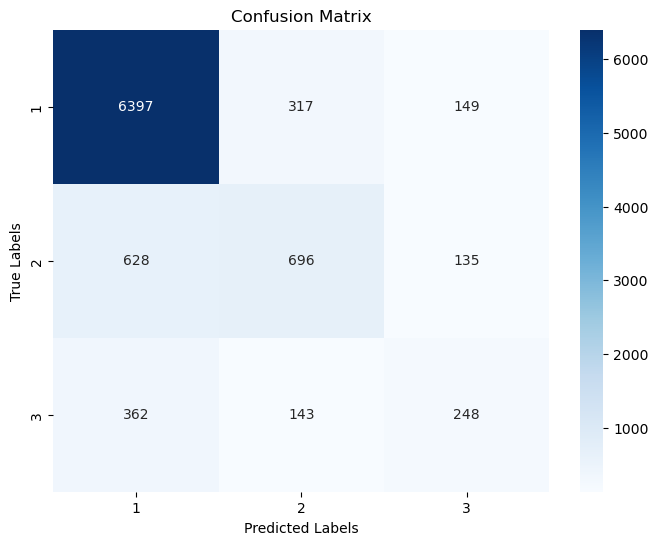


Classification Report:
              precision    recall  f1-score   support

           1       0.87      0.93      0.90      6863
           2       0.60      0.48      0.53      1459
           3       0.47      0.33      0.39       753

    accuracy                           0.81      9075
   macro avg       0.64      0.58      0.61      9075
weighted avg       0.79      0.81      0.80      9075



In [419]:
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Test Accuracy: {accuracy * 100:.2f}%")
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification Report: Precision, Recall, F1-Score for each class
print("\nClassification Report:")
print(classification_report(y_test, y_pred))



* Among the above Random Forest tends to perform better but overfits the data. Therefore, we will be soley focusing on tuning RF model and testing on the validation dataset

**Random Forest**

In [623]:
preprocessor

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['Room_Rate', 'Revenue_with_disc_log']),
                                ('ordinal',
                                 OrdinalEncoder(categories=[['Mid-School',
                                                             'High-School',
                                                             'College',
                                                             'Grad'],
                                                            ['<25K',
                                                             '25K --50K',
                                                             '50K -- 100K',
                                                             '>100K']]),
                                 ['Educational_Level', 'Income']),
                                ('binary',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Gender', 'Visted_Previously',
                                  'Previous_Cancellations',
                                  'Required_Car_Parking', 'Use_Promotion']),
                                ('multi',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Ethnicity', 'Country_region', 'Hotel_Type',
                                  'Meal_Type', 'Deposit_type',
                                  'Booking_channel'])])

In [858]:
X_processed = preprocessor.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.3, random_state=42)
oversample = SMOTE()
X_resampled, y_resampled = oversample.fit_resample(X_processed, y)
over_X_train, over_X_test, over_y_train, over_y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state = 42)

In [429]:
rf_model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, 
                              cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

grid_search_rf.fit(over_X_train, over_y_train)
best_rf_model = grid_search_rf.best_estimator_
best_params = grid_search_rf.best_params_

print(f"Best Hyperparameters: {best_params}")
y_pred_resampled = best_rf_model.predict(over_X_test)

accuracy_resampled = accuracy_score(over_y_test, y_pred_resampled)
print(f"Best Random Forest Test Accuracy on Resampled Data: {accuracy_resampled * 100:.2f}%")

print("\nBest Random Forest Classification Report on Resampled Data:")
print(classification_report(over_y_test, y_pred_resampled))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Hyperparameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best Random Forest Test Accuracy on Resampled Data: 92.92%

Best Random Forest Classification Report on Resampled Data:
              precision    recall  f1-score   support

           1       0.94      0.90      0.92      4570
           2       0.91      0.93      0.92      4570
           3       0.93      0.96      0.95      4570

    accuracy                           0.93     13710
   macro avg       0.93      0.93      0.93     13710
weighted avg       0.93      0.93      0.93     13710



In [860]:
model = RandomForestClassifier(
    bootstrap=False,
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    random_state=42
)
model.fit(over_X_train, over_y_train)

RandomForestClassifier(bootstrap=False, n_estimators=200, random_state=42)

In [861]:
y_pred = model.predict(X_test)
print(f"Classification report for Random Forest")
print(classification_report(y_test, y_pred))
print(f"Confusion matrix for Random Forest:")
print(confusion_matrix(y_test, y_pred))

Classification report for Random Forest
              precision    recall  f1-score   support

           1       0.99      0.98      0.98      6384
           2       0.93      0.96      0.94      1270
           3       0.93      0.95      0.94       596

    accuracy                           0.98      8250
   macro avg       0.95      0.96      0.96      8250
weighted avg       0.98      0.98      0.98      8250

Confusion matrix for Random Forest:
[[6261   86   37]
 [  46 1215    9]
 [  24    4  568]]


In [862]:
print(f'Best Training Accuracy: {model.score(over_X_train, over_y_train)}')
print(f'Best Testing Accuracy: {model.score(over_X_test, over_y_test)}')

Best Training Accuracy: 0.9999803829252982
Best Testing Accuracy: 0.9361268047708726


In [863]:
import joblib
joblib.dump(model, 'random_forest_model.pkl')
joblib.dump(preprocessor, 'preprocessor.pkl')

['preprocessor.pkl']

In [864]:
def predict_on_new_data(df):
    x_cols = [col for col in required_columns if col not in Nominal_target_var]
    X_new = df[x_cols]  
    X_new_preprocessed = preprocessor.transform(X_new)
    new_predictions = model.predict(X_new_preprocessed)
    df['Predictions'] = new_predictions
    return df

In [865]:
Test_data_Hotel_v3 = predict_on_new_data(Test_data_Hotel)

In [866]:
if 'Reservation_Status' in Test_data_Hotel_v3.columns: 
    true_values = Test_data_Hotel_v3['Reservation_Status']  
    predicted_values = Test_data_Hotel_v3['Predictions'] 
    accuracy = accuracy_score(true_values, predicted_values)
    print(f'Accuracy on the new dataset: {accuracy}')
else:
    print("True target column not found in the new dataset. Cannot calculate accuracy.")

Accuracy on the new dataset: 0.6849763550381958


In [867]:
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(true_values, predicted_values))

print("Confusion Matrix:")
print(confusion_matrix(true_values, predicted_values))


Classification Report:
              precision    recall  f1-score   support

           1       0.75      0.90      0.82      1610
           2       0.61      0.45      0.52       741
           3       0.37      0.26      0.31       398

    accuracy                           0.68      2749
   macro avg       0.58      0.54      0.55      2749
weighted avg       0.66      0.68      0.66      2749

Confusion Matrix:
[[1442  111   57]
 [ 285  336  120]
 [ 189  104  105]]


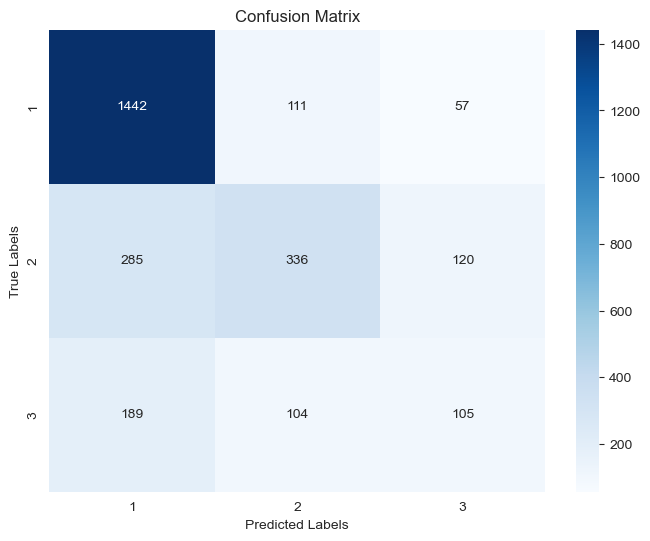

In [868]:
conf_matrix = confusion_matrix(true_values, predicted_values)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

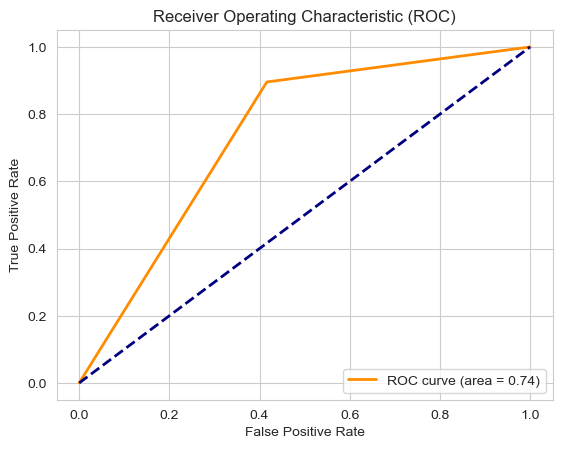

In [869]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_test_bin = label_binarize(true_values, classes=[1, 2, 3])
y_pred_bin = label_binarize(predicted_values, classes=[1, 2, 3])
fpr, tpr, _ = roc_curve(y_test_bin[:, 0], y_pred_bin[:, 0])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


In [870]:
num_columns = Continuous
ordinal_columns = Ordinal
binary_columns = Nominal_Binary  # One column per feature
multi_columns = []
for col in Nominal_Multi:
    unique_categories = X[col].nunique()
    multi_columns.extend([f"{col}_{i}" for i in range(unique_categories - 1)])

final_column_names = num_columns + ordinal_columns + binary_columns + multi_columns
X_transformed = pd.DataFrame(X_processed, columns=final_column_names)

In [871]:
ethnicity_categories = X['Ethnicity'].unique()  # Assuming you have this column in your dataset
country_region_categories = X['Country_region'].unique()  # Assuming you have this column in your dataset
meal_type_categories = X['Meal_Type'].unique()  # Example for meal type, adjust based on your dataset
hotel_type_categories = X['Hotel_Type'].unique()  # Example for hotel type, adjust based on your dataset
deposit_type_categories = X['Deposit_type'].unique()  # Deposit type categories
booking_channel_categories = X['Booking_channel'].unique()  # Booking channel categories

# Create mappings for each multi-class column
ethnicity_column_mapping = {f"Ethnicity_{i}": ethnicity_categories[i+1] for i in range(len(ethnicity_categories)-1)}
country_region_column_mapping = {f"Country_region_{i}": country_region_categories[i+1] for i in range(len(country_region_categories)-1)}
meal_type_column_mapping = {f"Meal_Type_{i}": meal_type_categories[i+1] for i in range(len(meal_type_categories)-1)}
hotel_type_column_mapping = {f"Hotel_Type_{i}": hotel_type_categories[i+1] for i in range(len(hotel_type_categories)-1)}
deposit_type_column_mapping = {f"Deposit_type_{i}": deposit_type_categories[i+1] for i in range(len(deposit_type_categories)-1)}
booking_channel_column_mapping = {f"Booking_channel_{i}": booking_channel_categories[i+1] for i in range(len(booking_channel_categories)-1)}

binary_column_mapping = {
    'Gender': 'Gender_M',
    'Visted_Previously': 'Visted_Previously_Yes',
    'Previous_Cancellations': 'Previous_Cancellations_Yes',
    'Required_Car_Parking': 'Required_Car_Parking_Yes',
    'Use_Promotion': 'Use_Promotion_Yes',
}
column_mapping = {**ethnicity_column_mapping, **country_region_column_mapping, 
                  **meal_type_column_mapping, **hotel_type_column_mapping,
                  **deposit_type_column_mapping, **booking_channel_column_mapping, **binary_column_mapping}


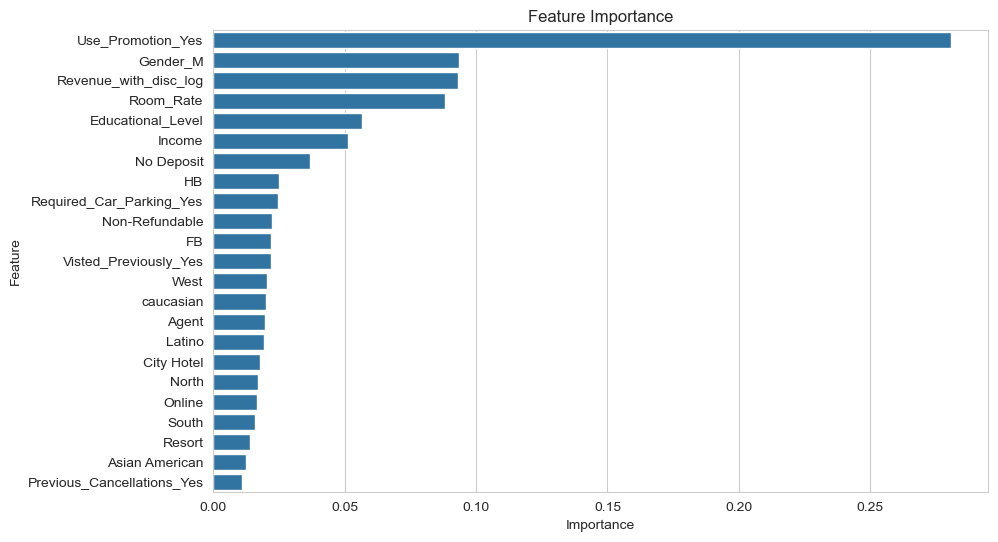

In [872]:

feature_importances = model.feature_importances_
feature_df = pd.DataFrame({
    'Feature': X_transformed.columns,
    'Importance': feature_importances
})

# Step 3: Update feature names with the mappings
feature_df['Feature'] = feature_df['Feature'].apply(lambda x: column_mapping.get(x, x))  # Replace encoded column names with original categories

# Step 4: Sort feature importance
feature_df = feature_df.sort_values(by='Importance', ascending=False)

# Step 5: Plot the feature importance graph
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_df)
plt.title('Feature Importance')
plt.show()


In [873]:
feature_df.style.background_gradient(cmap='viridis', axis=0)

,Feature,Importance
8,Use_Promotion_Yes,0.280846
4,Gender_M,0.093562
1,Revenue_with_disc_log,0.093248
0,Room_Rate,0.088178
2,Educational_Level,0.056723
3,Income,0.051131
19,No Deposit,0.036630
17,HB,0.024999
7,Required_Car_Parking_Yes,0.024721
20,Non-Refundable,0.022411


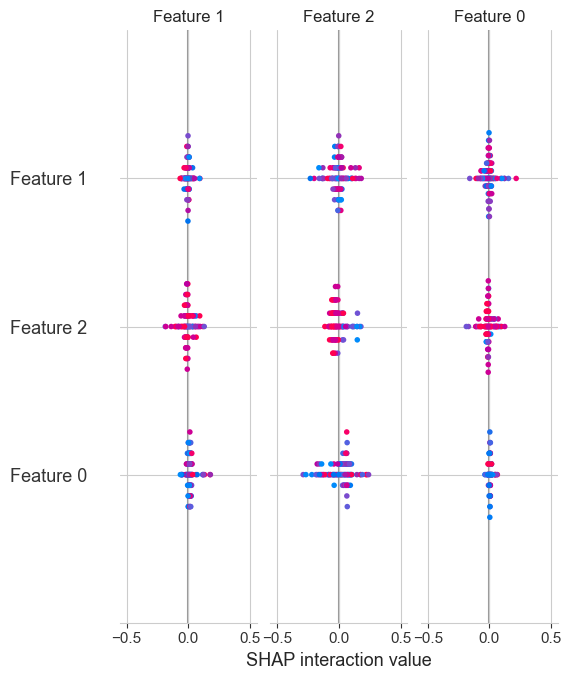

In [892]:
import shap

# Initialize SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for a subset of data (e.g., the first 100 rows)
shap_values = explainer.shap_values(over_X_train[:100])

# Visualize the SHAP summary plot
shap.summary_plot(shap_values, over_X_train[:100])
